# Redes Neuronales Convolucionales

## Redes Convolucionales y su importancia

Las Redes Convolucionales son usadas en el campo de la Visión Artificial; lo que se hace en este campo es enseñarle a las máquinas a interpretar estimilos visuales simulando la capacidad de "ver".

### Herramientas a utilizar

Existen varios frameworks como TensorFlow, PyTorch o Keras; son utilizados para diseñar y ejecutar modelos de inteligencia artificial. Utilizaremos Keras que más que un framework es una API que facilita la sintaxis de cómo consumimos TensorFlow (que es nuestro Backend para inteligencia artificial).

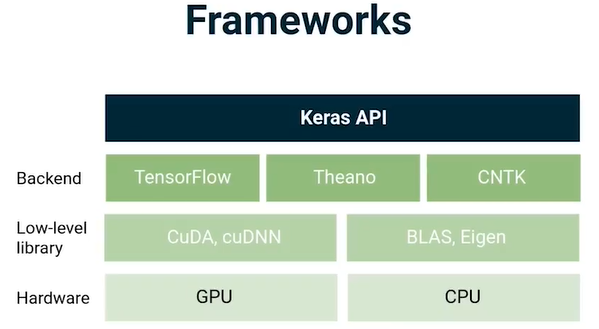

### Qué son las Redes Convolucionales

Las Redes Neuronales Convolucionales (CNN) son redes neuronales especializadas en el reconocimiento de imagen que intentan simular el comportamiento de la corteza visual de nuestro cerebro. 

Una convolución es un filtro que pasa sobre una imagen, la procesa y extrae características que muestran algo en común en la imagen.

![](nural-network-banner.gif)

## Primera Red Neuronal Convolucional

### Bibliotecas

Instalamos las bibliotecas

In [1]:
%pip install numpy pandas matplotlib tensorflow

  Using cached pandas-1.5.3-cp39-cp39-win_amd64.whl (10.9 MB)
  Using cached tensorflow-2.11.0-cp39-cp39-win_amd64.whl (1.9 kB)
  Using cached tensorflow_intel-2.11.0-cp39-cp39-win_amd64.whl (266.3 MB)
  Using cached libclang-15.0.6.1-py2.py3-none-win_amd64.whl (23.2 MB)
  Using cached astunparse-1.6.3-py2.py3-none-any.whl (12 kB)
  Using cached protobuf-3.19.6-cp39-cp39-win_amd64.whl (895 kB)
  Using cached tensorflow_estimator-2.11.0-py2.py3-none-any.whl (439 kB)
     ---------------------------------------- 0.0/3.7 MB ? eta -:--:--
     --- ------------------------------------ 0.3/3.7 MB 9.6 MB/s eta 0:00:01
     ------- -------------------------------- 0.7/3.7 MB 8.4 MB/s eta 0:00:01
     -------- ------------------------------- 0.8/3.7 MB 8.7 MB/s eta 0:00:01
     --------------- ------------------------ 1.5/3.7 MB 8.5 MB/s eta 0:00:01
     --------------------- ------------------ 2.0/3.7 MB 9.2 MB/s eta 0:00:01
     ------------------------ --------------- 2.3/3.7 MB 9.3 MB/s eta

Importamos las bibliotecas

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.layers import Conv2D, Dropout, MaxPooling2D, Flatten, Dense

### Cargar los datos

Utilizaremos el dataset Fashion MNIST el cual contiene 60000 imágenes de 28x28 píxeles en escala de grises; dichas imágenes representan 10 categorías de ropa como Camiseta, Vestido, Chaqueta, entre otros.

In [3]:
(trainImages, trainLabels), (testImages, testLabels) = fashion_mnist.load_data()

trainImages.shape

(60000, 28, 28)

Ahora visualicemos una imagen.

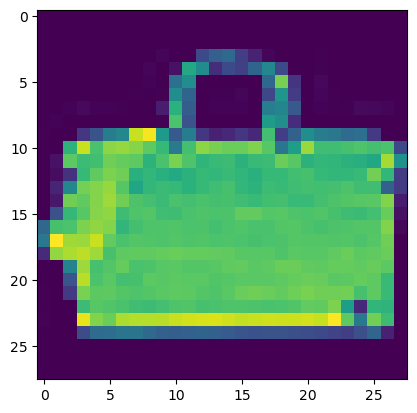

In [4]:
plt.imshow(trainImages[99])
plt.show()

La idea es que la red neuronal pueda distinguir los patrones y hacer una clasificación en las distintas categorías.

### Limpieza de los datos

In [5]:
# Cambiamos el tipo de datos a float32 para que sea más fácil para la red neuronal
# Como los valores van de 0 a 255 entonces dividimos entre 255 para que queden entre 0 y 1
trainImages = trainImages.astype("float32") / 255
testImages = testImages.astype("float32") / 255

# Hacemos que los datos sean tensores de 60000, 28x28 y un solo canal
trainImages = trainImages.reshape(trainImages.shape[0], 28, 28, 1)
testImages = testImages.reshape(testImages.shape[0], 28, 28, 1)

# Hacemos un One Hot Encoding de las categorías
trainLabels = tf.keras.utils.to_categorical(trainLabels, 10)
testLabels = tf.keras.utils.to_categorical(testLabels, 10)

### Creación del modelo

In [7]:
# Creamos un modelo secuencial como base
model = tf.keras.Sequential()
# Capa de convolución; 64 filtros; función de activación ReLu; forma de los datos de entrada
model.add(Conv2D(filters = 64, kernel_size = 2, padding = "same", activation = "relu", input_shape = (28, 28, 1)))
# Apilamos una capa de MaxPooling
model.add(MaxPooling2D(pool_size = 2))
# Capa de Dropout para reducir el Overfitting; se desactivan el 30% de las neuronas
model.add(Dropout(0.3))
# Capa de convolución; 32 filtros; función de activación ReLu
model.add(Conv2D(filters = 32, kernel_size = 2, padding = "same", activation = "relu"))
# Apilamos una capa de MaxPooling
model.add(MaxPooling2D(pool_size = 2))
# Capa de Dropout para reducir el Overfitting; se desactivan el 30% de las neuronas
model.add(Dropout(0.3))
# Capa que "aplana" los tensores para que queden en serie
model.add(Flatten())
# Una vez tenemos los datos de forma placa agregamos capas densas
model.add(Dense(256, activation = "relu"))
# Capa para reducir el Overfitting
model.add(Dropout(0.5))
# Capa final que arroja la predicción; 10 neuronas correspondientes a las 10 categorías; activación Softmax para la probabilidad de cada nivel
model.add(Dense(10, activation = "softmax"))

# Resumen del modelo
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 28, 28, 64)        320       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 14, 14, 64)       0         
 2D)                                                             
                                                                 
 dropout_3 (Dropout)         (None, 14, 14, 64)        0         
                                                                 
 conv2d_3 (Conv2D)           (None, 14, 14, 32)        8224      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 7, 7, 32)         0         
 2D)                                                             
                                                                 
 dropout_4 (Dropout)         (None, 7, 7, 32)         

### Entrenamiento del modelo

Primero compilamos el modelo especificando la función de pérdida, el optimizador y las métricas para evaluar.

In [10]:
model.compile(
    # Función de pérdida Categorical Cross Entropy porque es un problema de clasificación
    loss = "categorical_crossentropy",
    # Optimizador RMSPROP que es una versión mejorada del Gradient Descent
    optimizer = "rmsprop",
    # Como métrica utilizamos el Accuracy Score ya que es un problema de clasificación
    metrics = ["accuracy"]
)

Ahora entrenamos el modelo.

In [11]:
# Entrenamos con los datos de entrenamiento; entrenamos con paquetes de 64 durante 10 épocas o iteraciones
model.fit(trainImages, trainLabels, batch_size = 64, epochs = 10)

Epoch 1/10
938/938 [==============================] - 57s 60ms/step - loss: 0.5870 - accuracy: 0.7845
Epoch 2/10
938/938 [==============================] - 52s 55ms/step - loss: 0.4019 - accuracy: 0.8560
Epoch 3/10
938/938 [==============================] - 53s 57ms/step - loss: 0.3597 - accuracy: 0.8697
Epoch 4/10
938/938 [==============================] - 54s 57ms/step - loss: 0.3357 - accuracy: 0.8795
Epoch 5/10
938/938 [==============================] - 47s 50ms/step - loss: 0.3210 - accuracy: 0.8839
Epoch 6/10
938/938 [==============================] - 47s 50ms/step - loss: 0.3105 - accuracy: 0.8881
Epoch 7/10
938/938 [==============================] - 44s 47ms/step - loss: 0.3047 - accuracy: 0.8919
Epoch 8/10
938/938 [==============================] - 43s 46ms/step - loss: 0.3008 - accuracy: 0.8926
Epoch 9/10
938/938 [==============================] - 41s 44ms/step - loss: 0.2949 - accuracy: 0.8950
Epoch 10/10
938/938 [==============================] - 41s 43ms/step - loss: 0.295

### Evaluación del modelo

In [12]:
# Evaluamos el modelo con los datos de testing
model.evaluate(testImages, testLabels, verbose = 0)

[0.2737152874469757, 0.9036999940872192]

Obtuvimos un Accuracy Score del 90% aproximadamente.

## Manejo de Imágenes

Una imagen no es más que una composición de pixeles. Los pixeles tienen un valor numérico que va desde 0 hasta 255 (negro a blanco, en escala de grises). Las imágenes tienen un tamaño dado por el ancho y el largo y por dentro cada recuadro es un pixel y lo que interpreta la máquina es la matriz de valores numéricos. 

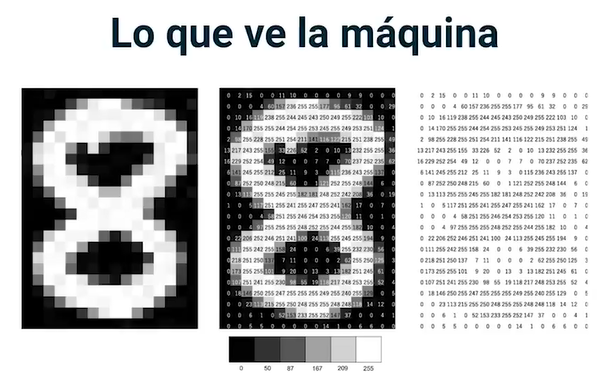

Las imágenes pueden tener hasta cuatro canales: Red, Green, Blue y Alpha; este formato se llama RGBA y con él podemos representar imágenes a color.

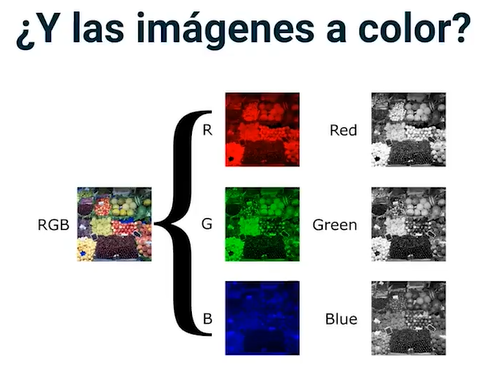

Al tener tres o cuatro capas se requiere más poder de cómputo por lo que es más eficiente trabajar con las imágenes en escala de grises siempre y cuando el color no sea importante.

**Consejos**
- Utilizar escala de grises siempre y cuando el color no importe.
- Es importante trabajar con unas dimensiones definidas, por ejemplo imágenes de 28x28 en un canal, y siempre trabajar con dichas dimensiones tanto en training como en testing.
- Existe una técnica llamada Data Augmentation que sirve para aumentar el conjunto de imágenes. Consiste en transformas las imágenes con las que se cuenta haciendo zoom, girándolas, rotándolas, cambiándoles el brillo. 

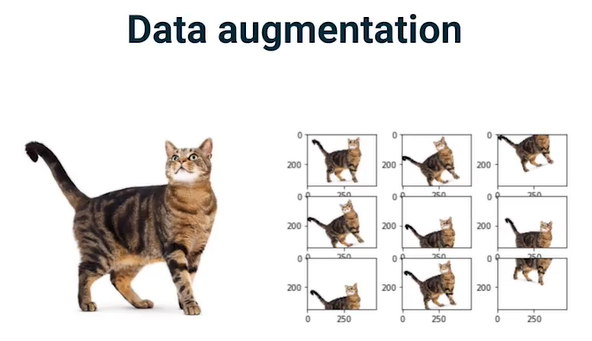

### Manejo de imágenes

In [2]:
%pip install scikit-image

     ---------------------------------------- 0.0/23.9 MB ? eta -:--:--
     ---------------------------------------- 0.1/23.9 MB 1.7 MB/s eta 0:00:14
     ---------------------------------------- 0.3/23.9 MB 2.9 MB/s eta 0:00:09
     - -------------------------------------- 0.7/23.9 MB 4.9 MB/s eta 0:00:05
     - -------------------------------------- 1.0/23.9 MB 5.4 MB/s eta 0:00:05
     -- ------------------------------------- 1.6/23.9 MB 6.8 MB/s eta 0:00:04
     --- ------------------------------------ 2.0/23.9 MB 7.1 MB/s eta 0:00:04
     ---- ----------------------------------- 2.4/23.9 MB 7.3 MB/s eta 0:00:03
     ---- ----------------------------------- 2.9/23.9 MB 7.6 MB/s eta 0:00:03
     ----- ---------------------------------- 3.3/23.9 MB 7.8 MB/s eta 0:00:03
     ------ --------------------------------- 3.8/23.9 MB 8.1 MB/s eta 0:00:03
     ------- -------------------------------- 4.3/23.9 MB 8.2 MB/s eta 0:00:03
     ------- -------------------------------- 4.8/23.9 MB 8

In [3]:
import numpy as np 
import matplotlib.pyplot as plt
from skimage import io

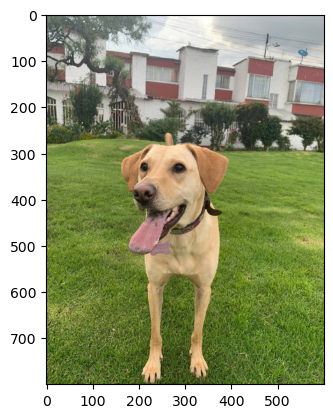

In [17]:
im = io.imread('./Mara.jpeg')
plt.imshow(im)
plt.show()

In [18]:
im.shape

(800, 600, 3)

Vemos que la imagen es de 800x600 pixeles y tiene 3 canales ya que es a color.

Separar por canales de color

In [19]:
# El canal rojo es el 0
red = im[:, :, 0]
# Canal verde el 1
green = im[:, :, 1]
# Canal azul el 2
blue = im[:, :, 2]

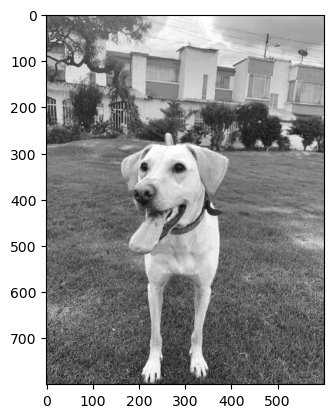

In [20]:
plt.imshow(red, cmap = "gray")
plt.show()

Nos muestra la imagen en escala de grises aunque pasemos el canal rojo ya que solo tenemos un canal, eso significa que solo visualizamos en escala de grises la imagen.

Al tener una matriz podemos hacer con ella todo lo relacionado con el álgebra lineal.

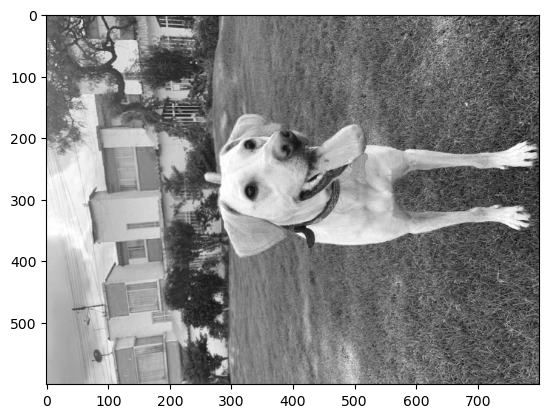

In [21]:
plt.imshow(red.T, cmap = "gray")
plt.show()

RGB con un único canal activo

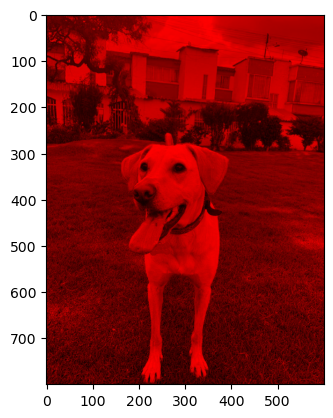

In [22]:
# Capa auxiliar del tamaño de la imagen llena de ceros
aux = np.zeros([800, 600])

# Creamos una capa a color stackeando la capa roja y nuestra capa auxiliar llena de ceros para el canal verde y el canal azul
red = np.dstack((red, aux, aux)).astype(np.uint8)

green = np.dstack((aux, green, aux)).astype(np.uint8)
blue = np.dstack((aux, aux, blue)).astype(np.uint8)

plt.imshow(red)
plt.show()

Podemos también mostrar la imagen en negativo.

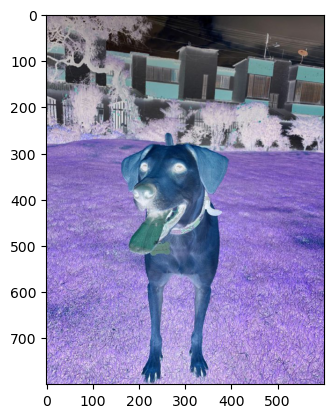

In [23]:
imNegPos = 255 - im
plt.imshow(imNegPos)
plt.show()

Incluso podemos bajar la resolución.

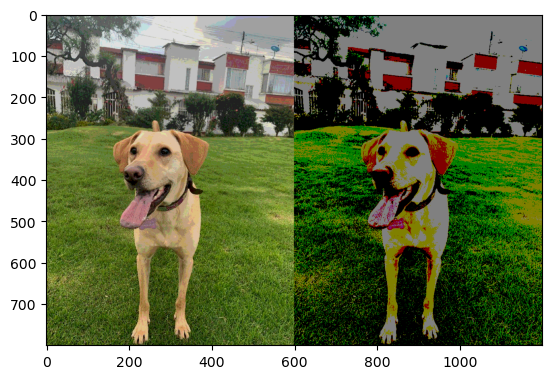

In [24]:
im32 = (im // 32) * 32
im128 = (im // 128) * 128

plt.imshow(np.concatenate((im32, im128), axis = 1))
plt.show()

Y podemos hacer zoom a la imagen cambiando cómo recorremos la matriz.

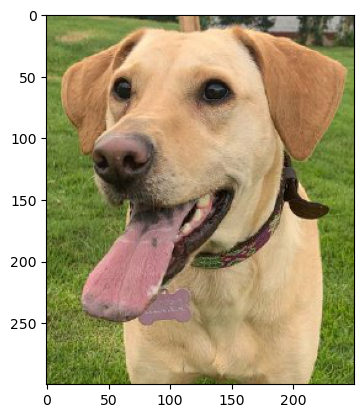

In [25]:
plt.imshow(im[270:570, 150:400])
plt.show()

## Fundamentos de Redes Neuronales Convolucionales

### Kernel o Filtro

El Kernel es una matriz que se desliza desde la esquina superior izquierda hasta la esquina inferior derecha, paso por paso, hasta terminar toda la imagen, haciendo una operación matemática llamada convolución.

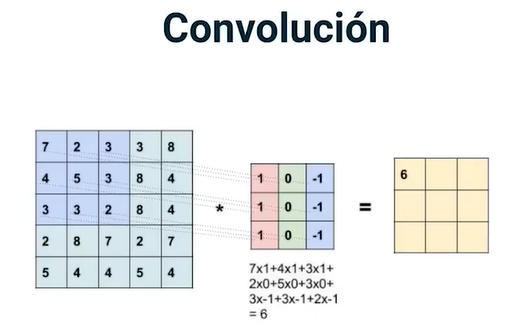
![](kernel.gif)

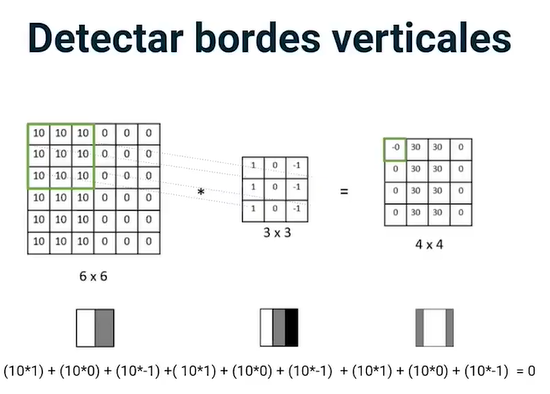
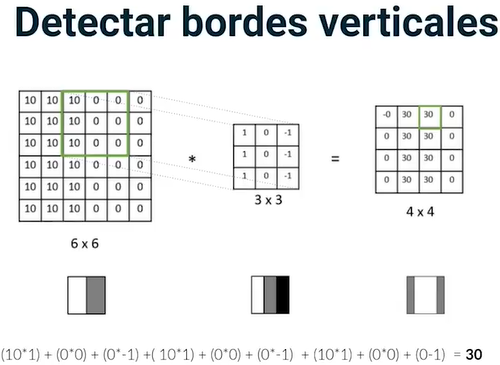

Utilizando diferentes Kernels podemos detectar cosas como los bordes de una imagen y muchas más características; esto por sí solo no sirve, por ejemplo, para detectar si una imagen corresponde a un gato y es ahí cuando utilizamos Deep Learning apilando capas y capas que van haciendo cada vez imágenes más complejas y se obtienen características más específicas.

### Aplicación de Kernels

Importar las bibliotecas

In [1]:
import numpy as np
import matplotlib.pyplot as plt 
import scipy.ndimage as nd 
from skimage import  io, color 

Cargar imagen

In [5]:
# Cargar la imagen
img = io.imread("yo.jpg")
# Convertir la imagen a escala de grises
imgGray = color.rgb2gray(img)

imgGray.shape

(912, 860)

La imagen tiene un tamaño de 912x860 pixeles.

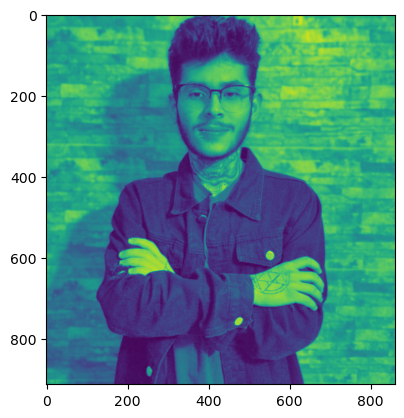

In [6]:
plt.imshow(imgGray)
plt.show()

Vamos a crear un Kernel para aplicar un filtro.

In [7]:
# Filtro utilizado para detectar bordes verticales
kernel = np.array([
    [-1, 0, 1],
    [-1, 0, 1],
    [-1, 0, 1]
])

Ahora aplicamos convolución.

In [8]:
# Aplicar convolución a la imagen con el kernel definido para detección de bordes verticales
imgConv = nd.convolve(imgGray, kernel)

Visualizamos el resultado.

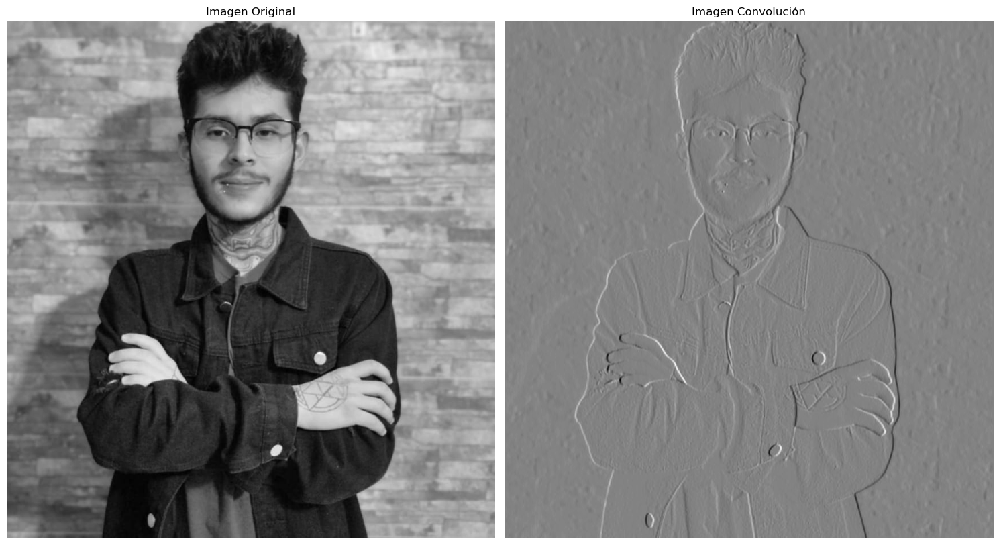

In [12]:
fig, axes = plt.subplots(1, 2, figsize = (15, 10))

axes[0].imshow(imgGray, cmap = plt.cm.gray)
axes[0].set_title("Imagen Original")
axes[0].axis("off")

axes[1].imshow(imgConv, cmap = plt.cm.gray)
axes[1].set_title("Imagen Convolución")
axes[1].axis("off")

fig.tight_layout()

Podemos definir distintos Kernels.

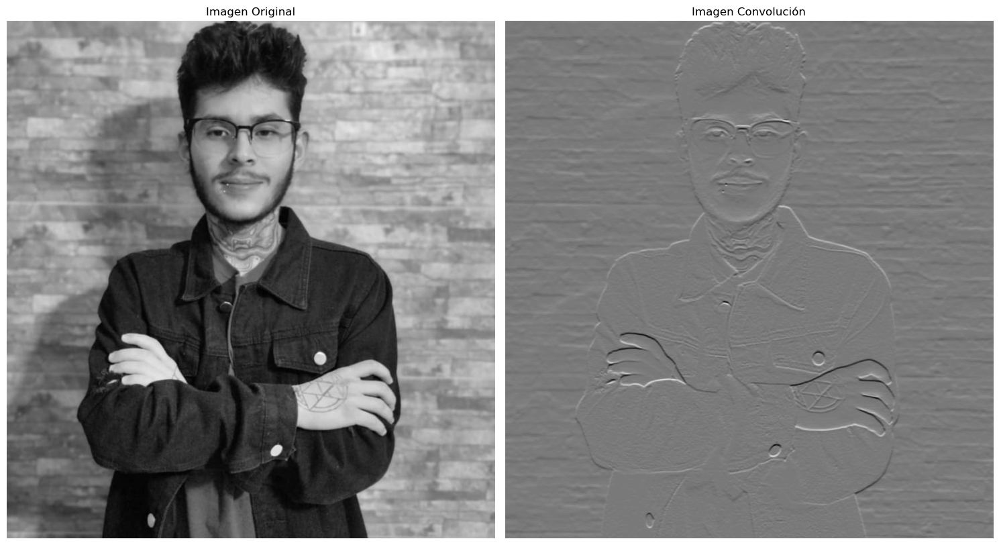

In [14]:
# Filtro utilizado para detectar bordes horizontales
kernel = np.array([
    [-1, -1, -1],
    [0, 0, 0],
    [1, 1, 1]
])

# Aplicar convolución a la imagen con el kernel definido para detectar bordes horizontales
imgConv = nd.convolve(imgGray, kernel)

fig, axes = plt.subplots(1, 2, figsize = (15, 10))

axes[0].imshow(imgGray, cmap = plt.cm.gray)
axes[0].set_title("Imagen Original")
axes[0].axis("off")

axes[1].imshow(imgConv, cmap = plt.cm.gray)
axes[1].set_title("Imagen Convolución")
axes[1].axis("off")

fig.tight_layout()

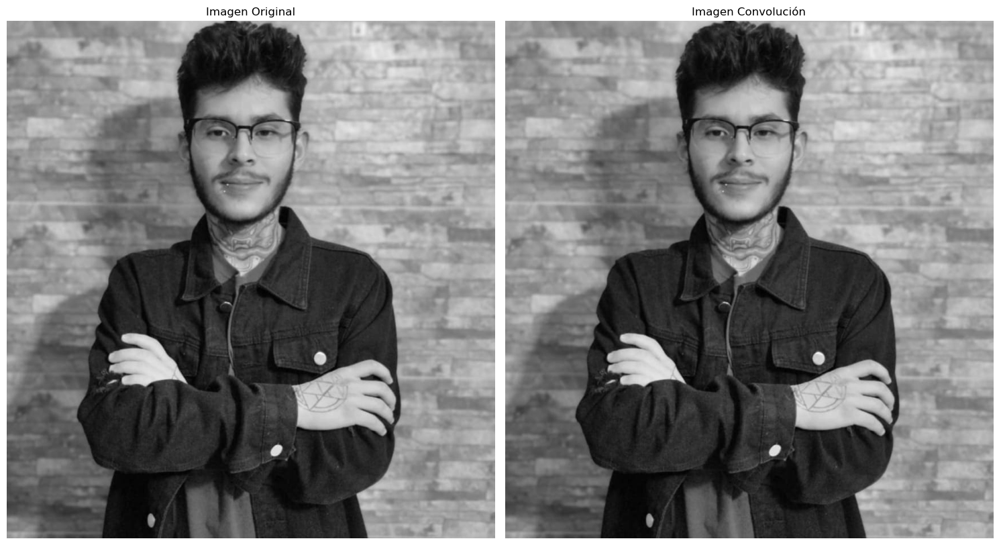

In [13]:
# Filtro utilizado para devolver la misma imagen
kernel = np.array([
    [0, 0, 0],
    [0, 1, 0],
    [0, 0, 0]
])

# Aplicar convolución a la imagen con el kernel definido para devolver la misma imagen
imgConv = nd.convolve(imgGray, kernel)

fig, axes = plt.subplots(1, 2, figsize = (15, 10))

axes[0].imshow(imgGray, cmap = plt.cm.gray)
axes[0].set_title("Imagen Original")
axes[0].axis("off")

axes[1].imshow(imgConv, cmap = plt.cm.gray)
axes[1].set_title("Imagen Convolución")
axes[1].axis("off")

fig.tight_layout()

### Padding

El padding es un margen que se le agrega a la imagen para que al momento de realizar la convolución la imagen resultante no disminuya su tamaño respecto a la original. Se agregan 0 para que no se alteren las características de la imagen original. El padding puede ser de muchos tamaños.

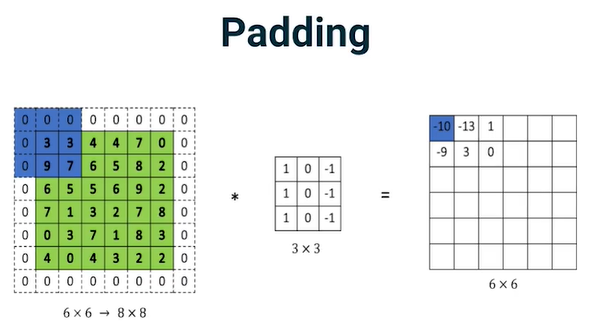
![](padding.gif)

### Strides

El Stride es el tamaño de del paso en cada convolución. Entre mayor sea el paso menor será el tamaño de la imagen resultante.

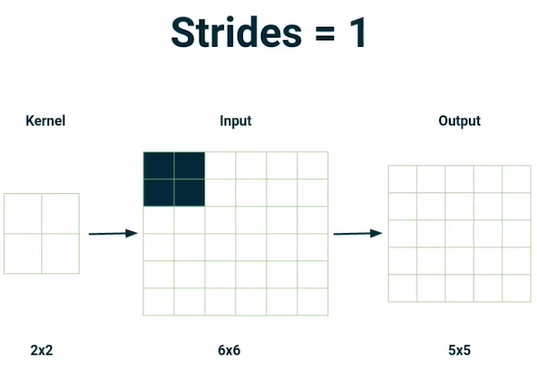
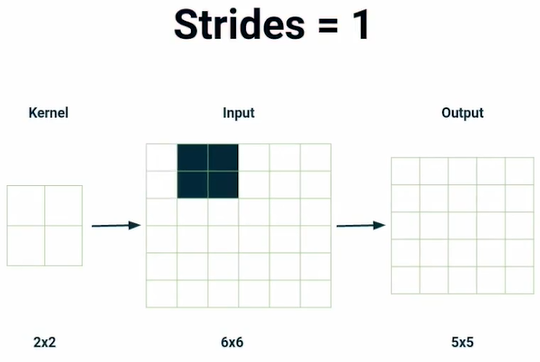

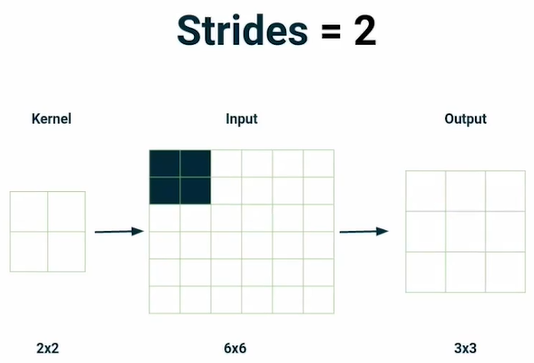
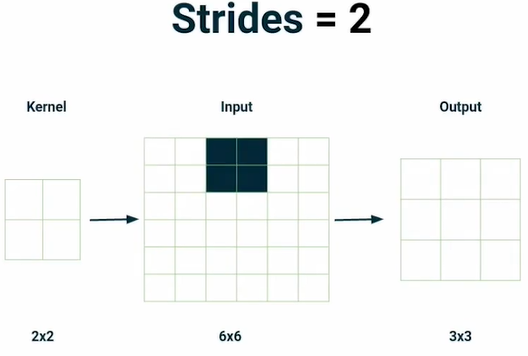

![](stride.gif)


### Cómo se implementa Padding y Strides

- Invocar la capa de convolución que se desea utilizar.
- Filters: cuántos Kernels se van a utilizar.
- Kernel_size: el tamaño de la matriz del kernel.
- Strides: se reciben como una tupla en la cual el primer valor registra el movimiento hacia los lados y el segundo el movimiento hacia arriba o hacia abajo.
- Padding: recibe en un array dos valores: "valid" y "same". 
Si se selecciona "same", entonces Keras automáticamente se encarga de todos los hiperparámetros para que el padding sea lo suficientemente grande, tanto para que la imagen de entrada como la de salida sean exactamente las mismas y no se pierda ningún dato durante el proceso.
Si se selecciona "valid", entonces no aplica el padding. Al momento de pasar el filtro tomará el primer hasta el último pixel original de la imagen pero esto resultara en una imagen más corta en ancho y largo.

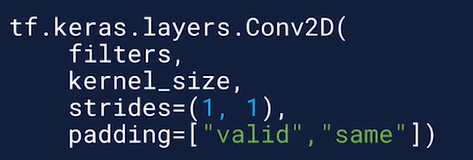

### Capa de Pooling

A medida que se avanza en la profundidad de la red a su vez aumenta el número de imágenes generadas por los kernels lo que hace al modelo más pesado. 

La capa de pooling es otro Kernel que se encarga de disminuir el tamaño de las imágenes resultantes de una convolución. Es posible obtener el pixel más alto o sacar el promedio. Esto también ayuda a reducir el ruido mientras se conservan las características más importantes de la imagen.

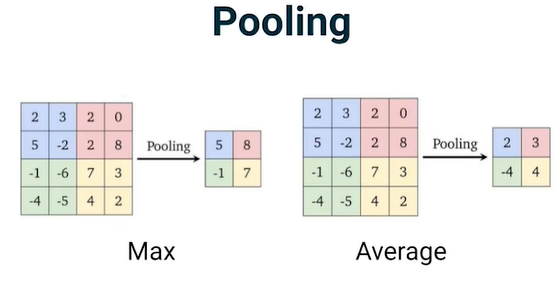
![](maxpool.gif)

En resumen, mientras avancemos en las capas de la CNN:
- Se irá aumentando el número de canales en la imagen (imágenes resultantes de convolución).
- Se irá disminuyendo el tamaño de las imágenes debido a la capa de pooling.

### Arquitectura de las Redes Neuronales Convolucionales

Se tienen múltiples imágenes de entradas las cuales pasarán por una por una capa de convolución en la cual se extraerán características como bordes, texturas, entre otras; las capas de convolución suelen ir atadas a una capa de max pooling para reducir el ruido, complejidad y tamaño de las imágenes; se apilan varias capas convolucionales y de max pooling para obtener una imagen mucho más pequeña y a su vez mucho más profunda en su contexto; luego se aplica una capa de flatten que lo que hace es aplanar la imagen volviéndola un arreglo de una sola dimensión para luego hacer una clasificación apilando capas densas.

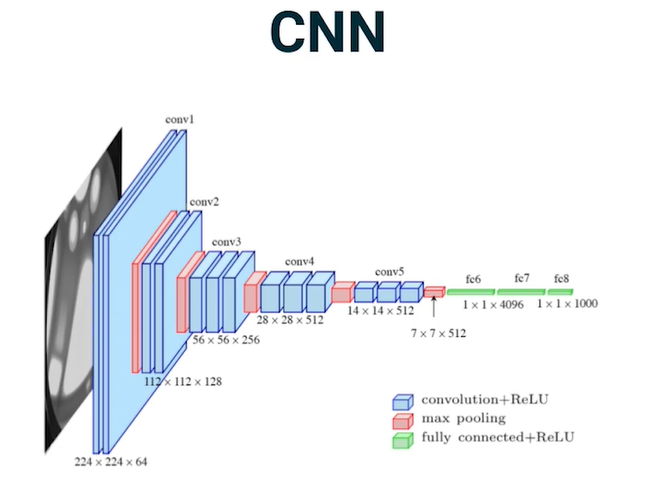
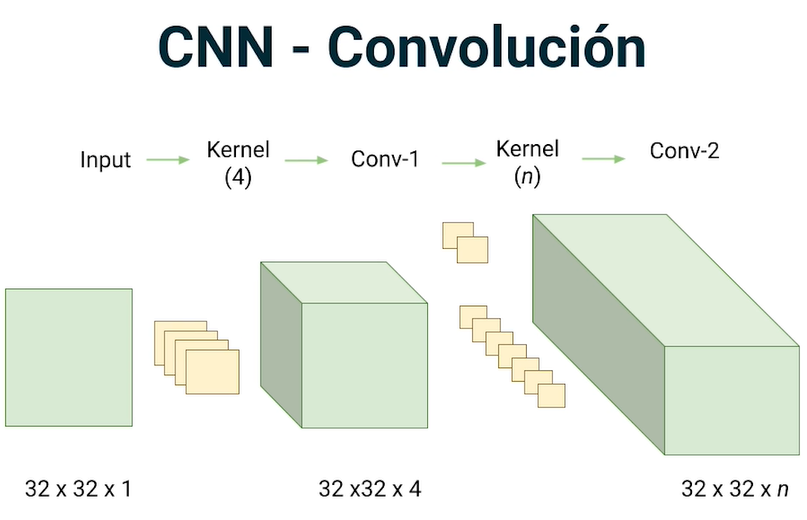
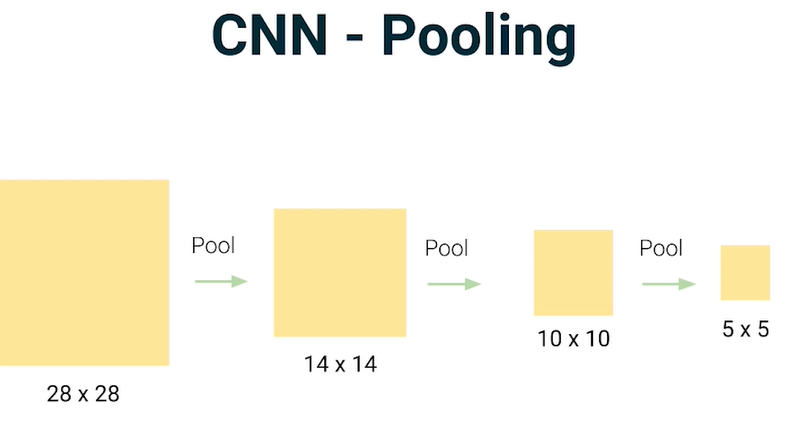
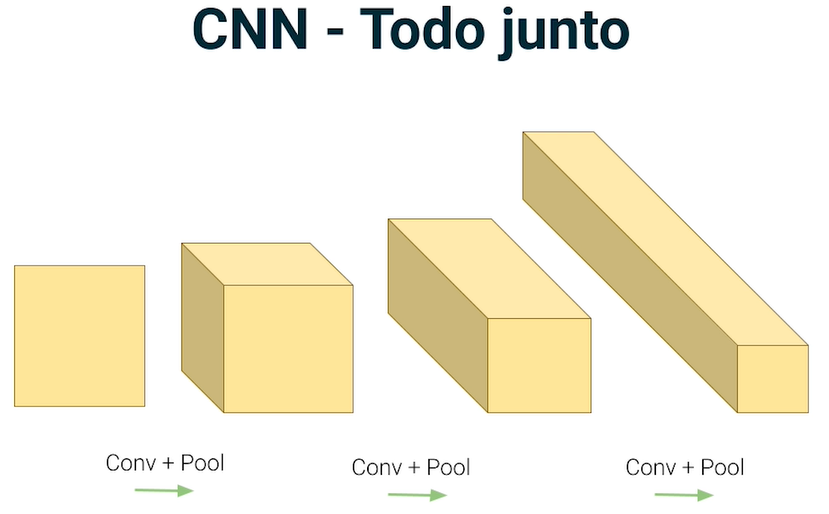
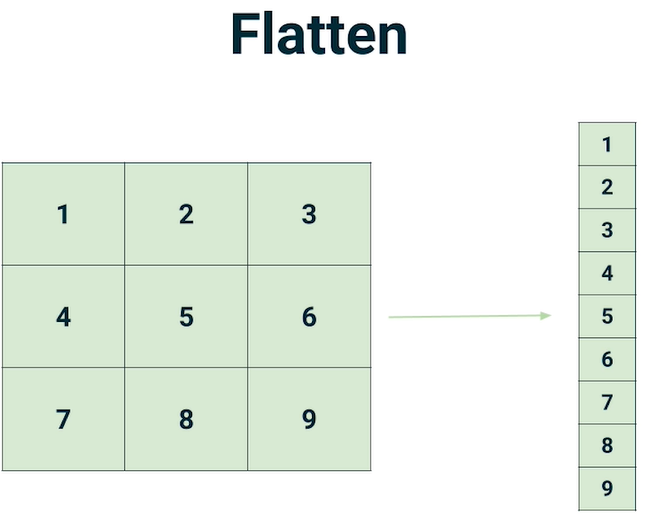
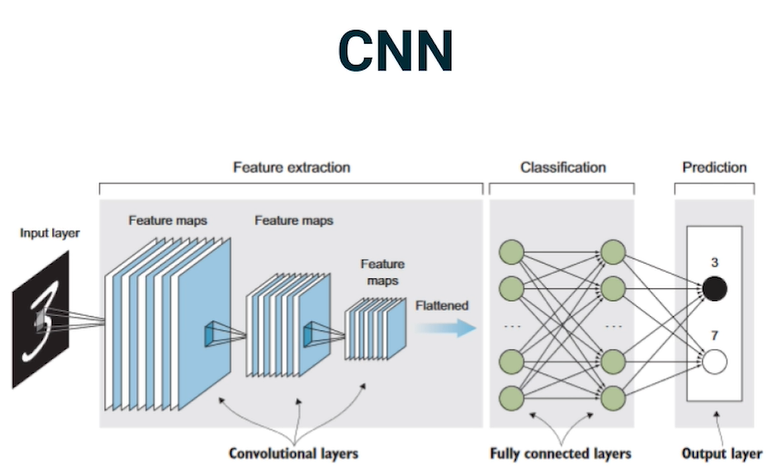

Al final, el número de features de salida está dado por la siguiente fórmula:

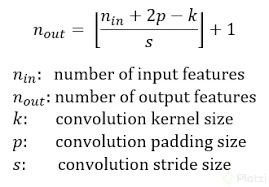

## Clasificación con Redes Neuronales Convolucionales

Utilizaremos el dataset [**CIFAR10**](https://keras.io/api/datasets/cifar10/) el cual contiene 50000 imágenes de 32x32 a color para training y 10000 para testing; dichas imágenes pertenecen a una de diez categorías: avión, carro, pájaro, gato, ciervo, perro, rana, caballo, barco o camión.

### Importar las bibliotecas

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import regularizers
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Activation, BatchNormalization

### Cargar los datos

In [2]:
(XTrain, yTrain), (XTest, yTest) = cifar10.load_data()

170498071/170498071 [==============================] - 61s 0us/step


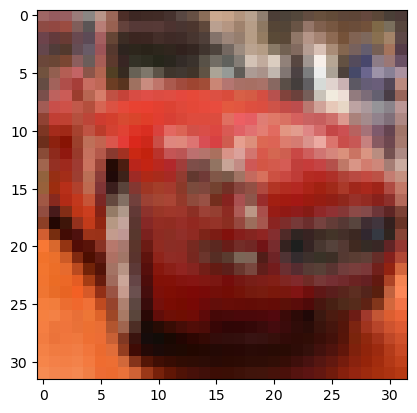

In [3]:
plt.imshow(XTrain[5])
plt.show()

### Limpieza de los datos

Primero cambiamos el tipo de dato usado en las imágenes para que sean números de punto flotante.

In [5]:
XTrain = XTrain.astype("float32")
XTest = XTest.astype("float32")

Lo siguiente es codificar las categorías a las que pertenecen las imágenes.

In [6]:
# Las posibles clasificaciones que puede tener una imagen
numClasses = len(np.unique(yTrain))

# Codificamos la categoría
yTrain = to_categorical(yTrain, numClasses)
yTest = to_categorical(yTest, numClasses)

yTrain[5]

array([0., 1., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32)

Finalmente, aplicamos una normalización a los datos para que sus valores no sean tan dispersos.

In [7]:
mean = np.mean(XTrain)
std = np.std(XTrain)

XTrain = (XTrain - mean) / (std + 1e-7)
XTest = (XTest - mean) / (std + 1e-7)

array([[[ 0.5969213 , -0.2916208 , -0.30720925],
        [ 0.45662522, -0.46309385, -0.40074   ],
        [ 0.5033906 , -0.40074   , -0.3695631 ],
        ...,
        [-0.46309385, -0.774863  , -1.0086899 ],
        [-0.7280976 , -0.8995707 , -1.0242784 ],
        [-0.69692075, -0.97751296, -1.0242784 ]],

       [[ 0.33191755, -0.71250916, -0.8216284 ],
        [ 0.39427137, -0.75927454, -0.8528053 ],
        [ 0.53456753, -0.69692075, -0.8683938 ],
        ...,
        [ 0.09809066, -0.24485542, -0.774863  ],
        [ 0.02014837, -0.15132467, -0.43191692],
        [-0.5410361 , -0.8060399 , -0.9307476 ]],

       [[-0.18250158, -0.83721685, -0.71250916],
        [-0.33838618, -0.97751296, -0.94633603],
        [-0.24485542, -0.9619245 , -1.0710437 ],
        ...,
        [ 0.25397524, -0.13573621, -0.6345669 ],
        [ 0.6592752 ,  0.17603296, -0.24485542],
        [-0.43191692, -0.75927454, -0.774863  ]],

       ...,

       [[ 1.9219403 ,  0.12926759, -0.79045147],
        [ 1

### División del set de Training

Dividiremos el conjunto de Training para tener un set de Validación.

In [8]:
XTrain.shape

(50000, 32, 32, 3)

Como tenemos 50000 imágenes para training entonces tomaremos 50000 para usarlas en validación.

In [9]:
(XTrain, XValid) = XTrain[5000:], XTrain[:5000]
(yTrain, yValid) = yTrain[5000:], yTrain[:5000]

Finalmente, nuestros datasets quedaron con las siguientes cantidades de imágenes.

In [10]:
print("Train: ", XTrain.shape[0])
print("Valid: ", XValid.shape[0])
print("Test: ", XTest.shape[0])

Train:  45000
Valid:  5000
Test:  10000


### Construcción del modelo

In [11]:
# Número de filtros para las convolucioines
baseFilters = 32
# Peso para el regularizador
weightRegularizer = 1e-4

In [15]:
# Creamos un modelo secuencial
model = Sequential()

# Convolución 1

# Agregamos una capa de convolución con 32 filtros de tamaño 3x3; utlizamos padding same para que se mantengan las dimensiones de la imagen
# utilizamos regularización Ridge con un peso de 1e-4; tamaño de las imágenes de entrada de 32x32 con 3 capas
model.add(Conv2D(baseFilters, (3, 3), padding = "same", kernel_regularizer = regularizers.l2(weightRegularizer), input_shape = XTrain.shape[1:]))
# Agregamos una capa de activación con ReLu
model.add(Activation("relu"))


# Convolución 2
# Agregamos una capa de convolución con 32 filtros de tamaño 3x3; utlizamos padding same para que se mantengan las dimensiones de la imagen
# utilizamos regularización Ridge con un peso de 1e-4
model.add(Conv2D(baseFilters, (3, 3), padding = "same", kernel_regularizer = regularizers.l2(weightRegularizer)))
# Agregamos una capa de activación con ReLu
model.add(Activation("relu"))
# Agregamos capa de pooling para eliminar ruido y reducir complejidad; el tamaño será de 2x2
model.add(MaxPooling2D(pool_size = (2,2)))
# Agregamos una capa de Dropout para vigilar el Overfitting; la probabilidad de drop será de 0.2
model.add(Dropout(0.2))

"""
Haremos que las capas sean más profundas aumentando la cantidad de filtros cada dos capas; además, haremos el pooling cada dos convoluciones
"""

# Convolución 3
# Agregamos una capa de convolución con 64 filtros de tamaño 3x3; utlizamos padding same para que se mantengan las dimensiones de la imagen
# utilizamos regularización Ridge con un peso de 1e-4
model.add(Conv2D(2 * baseFilters, (3, 3), padding = "same", kernel_regularizer = regularizers.l2(weightRegularizer)))
# Agregamos una capa de activación con ReLu
model.add(Activation("relu"))
# Agregamos una capa de Dropout para vigilar el Overfitting; la probabilidad de drop será de 0.2
model.add(Dropout(0.2))


# Convolución 4
# Agregamos una capa de convolución con 64 filtros de tamaño 3x3; utlizamos padding same para que se mantengan las dimensiones de la imagen
# utilizamos regularización Ridge con un peso de 1e-4
model.add(Conv2D(2 * baseFilters, (3, 3), padding = "same", kernel_regularizer = regularizers.l2(weightRegularizer)))
# Agregamos una capa de activación con ReLu
model.add(Activation("relu"))
# Agregamos capa de pooling para eliminar ruido y reducir complejidad; el tamaño será de 2x2
model.add(MaxPooling2D(pool_size = (2,2)))
# Agregamos una capa de Dropout para vigilar el Overfitting; la probabilidad de drop será de 0.3
model.add(Dropout(0.3))


# Convolución 5
# Agregamos una capa de convolución con 128 filtros de tamaño 3x3; utlizamos padding same para que se mantengan las dimensiones de la imagen
# utilizamos regularización Ridge con un peso de 1e-4
model.add(Conv2D(4 * baseFilters, (3, 3), padding = "same", kernel_regularizer = regularizers.l2(weightRegularizer)))
# Agregamos una capa de activación con ReLu
model.add(Activation("relu"))
# Agregamos una capa de Dropout para vigilar el Overfitting; la probabilidad de drop será de 0.3
model.add(Dropout(0.3))


# Convolución 6
# Agregamos una capa de convolución con 128 filtros de tamaño 3x3; utlizamos padding same para que se mantengan las dimensiones de la imagen
# utilizamos regularización Ridge con un peso de 1e-4
model.add(Conv2D(4 * baseFilters, (3, 3), padding = "same", kernel_regularizer = regularizers.l2(weightRegularizer)))
# Agregamos una capa de activación con ReLu
model.add(Activation("relu"))
# Agregamos capa de pooling para eliminar ruido y reducir complejidad; el tamaño será de 2x2
model.add(MaxPooling2D(pool_size = (2,2)))
# Agregamos una capa de Dropout para vigilar el Overfitting; la probabilidad de drop será de 0.3
model.add(Dropout(0.4))


# Clasificación
# Aplanamos el resultado de las capas anteriores para que sea un array de dimensión 1
model.add(Flatten())
# Agregamos la capa densa que tendrá 10 neuronas y utilizará la función Softmax para devolver la probabilidad de cada label
model.add(Dense(numClasses, activation = "softmax"))


# Resumen del modelo
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 32, 32, 32)        896       
                                                                 
 activation_6 (Activation)   (None, 32, 32, 32)        0         
                                                                 
 conv2d_8 (Conv2D)           (None, 32, 32, 32)        9248      
                                                                 
 activation_7 (Activation)   (None, 32, 32, 32)        0         
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 16, 16, 32)       0         
 2D)                                                             
                                                                 
 dropout_5 (Dropout)         (None, 16, 16, 32)        0         
                                                      

### Entrenamiento del modelo

In [16]:
# Compilamos el modelo con función de pérdida Categorical Cross-Entropy; optimizador RMSPROP que es una versión mejorada del Gradient Descent 
# como métrica utilizamos el Accuracy
model.compile(
    loss = "categorical_crossentropy",
    optimizer = "rmsprop",
    metrics = "accuracy"
)

In [19]:
# Entrenamos el modelo
hist = model.fit(XTrain, yTrain,
    # Se toman de a 128 imágenes en cada época
    batch_size = 128,
    # Entrenamos por 80 épocas
    epochs = 80,
    # Sets de validación
    validation_data = (XValid, yValid),
    #
    verbose = 2,
    # Mezclar los datos
    shuffle = True
)

Epoch 1/100
352/352 - 124s - loss: 1.4892 - accuracy: 0.4723 - val_loss: 1.5037 - val_accuracy: 0.4822 - 124s/epoch - 353ms/step
Epoch 2/100


KeyboardInterrupt: 

### Evaluación del modelo

In [ ]:
plt.plot(hist.history["accuracy"], label = "Train")
plt.plot(hist.history["val_accuracy"], label = "Validation")
plt.legend()
plt.show()

In [ ]:
model.evaluate(XTest, yTest)

## Optimización de una Red Neuronal Convolucional

### Data Augmentation

Es difícil obtener y clasificar imágenes para luego poder usarlas para entrenar un modelo: hay que tomar fotos desde distintos ángulos, con distintos fondos de luz, distintas formas y luego hacer una clasificación manual. Data Augmentationa consiste en tomar una imagen y hacerle modificaciones como zoom, desplazarla en los ejes X o Y, aumentar el brillo, rotar la image. Lo que se hace es mantener la imagen y sus características principales pero creando imágenes distintas para la máquina.

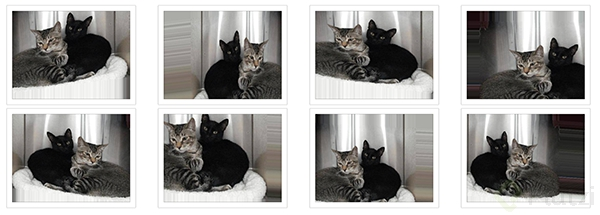

### Aplicando Data Augmentation

In [2]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
import matplotlib.pyplot as plt

Lo primero es utilizar el generador de imágenes.

In [7]:
dataGen = ImageDataGenerator(
    # Rotación en grados
    rotation_range = 40,
    # Mover la imagen en el eje X
    width_shift_range = 0.2,
    # Mover la imagen en el eje Y
    height_shift_range = 0.2,
    # Zoom
    zoom_range = 0.2,
    # Habilitar que pueda usar un modo espejo de forma horizontal
    horizontal_flip = True,
    # Rellenar los espacios vacíos de la imagen al momento de transformarla
    fill_mode = "nearest",
    # Cambiar el brillo de la imagen
    brightness_range = [0.4, 1.5]
)

Lo siguiente es cargar la imagen.

In [4]:
img = load_img("Mara.jpeg")

Convertimos la imagen a un array.

In [5]:
X = img_to_array(img)
X.shape

(800, 600, 3)

La imagen es de 800x600 con 3 canales de color; haremos una reestructuración de cómo Keras recibe los datos.

In [6]:
X = X.reshape((1,) + X.shape)
X.shape

(1, 800, 600, 3)

Así sabrá que solo recibe una imagen.

Ahora generamos imágenes a partir de un directorio.

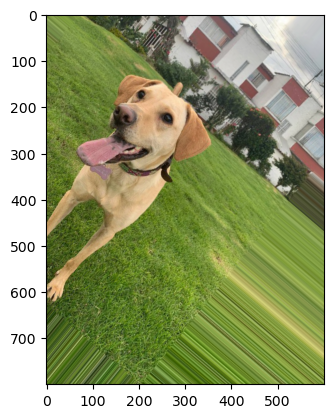

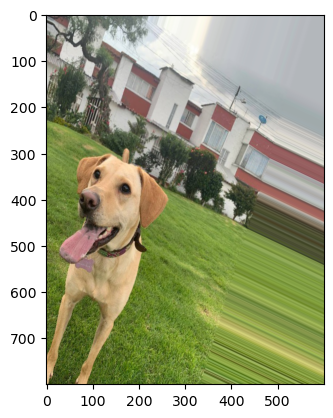

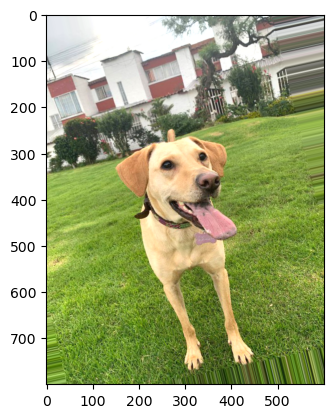

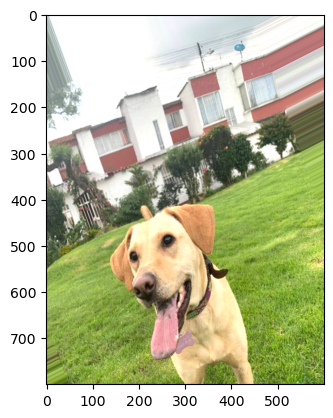

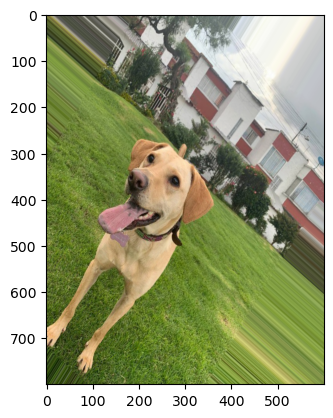

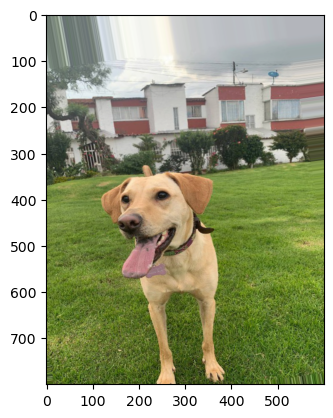

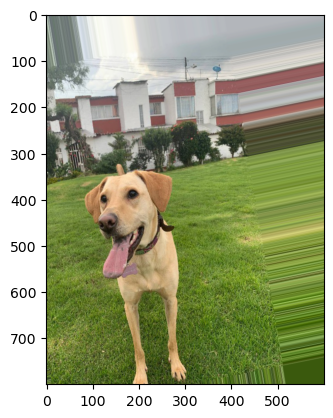

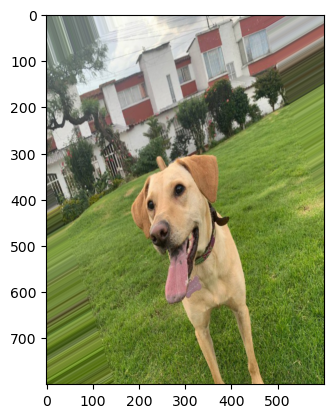

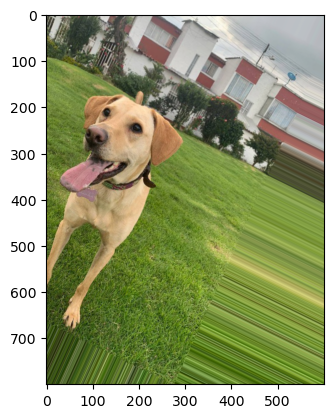

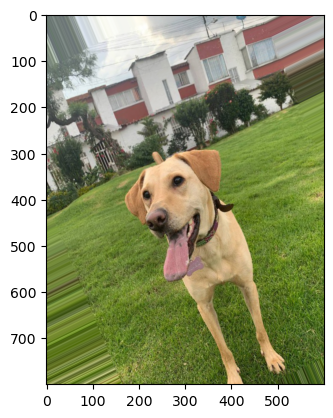

In [8]:
i = 0
for batch in dataGen.flow(X, batch_size = 1):
    plt.figure(i)
    imgplot = plt.imshow(array_to_img(batch[0]))
    i += 1
    if i % 10 == 0 :
        break
plt.show()

Usualmente no tenemos cargadas las imágenes directamente en memoria sino que están en directorios por lo que utilizamos lo siguiente.

In [10]:
trainGen = dataGen.flow_from_directory(
    # Directorio donde están las imágenes
    "catsDogs/train", 
    # Tamaño de las imágenes
    target_size = (150, 150),
    # Lotes de 32 imágenes
    batch_size = 32,
    # Modelo de clasificación binaria
    class_mode = "binary"
)

Found 2000 images belonging to 2 classes.


Vemos que encontró 2000 imágenes correspondientes a 2 clases.

In [11]:
trainGen[0][0].shape

(32, 150, 150, 3)

En el primer batch tiene 32 imágenes de 150x150 y con 3 canales.

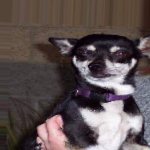

In [12]:
array_to_img(trainGen[0][0][1])

Aquí vemos la primera imagen la cual ha sido modificada.

### Callbacks

Un callback es un objeto que puede realizar acciones en distintas etapas del entrenamiento de un modelo, ya sea al inicio o al final de una época, antes o después de un batch, etc. Los callbacks sirven para guardar el modelo en nuestro disco de forma periódica, obtener una visión de los estadísticos del modelo durante el entrenamiento e incluso detenerlo si identificamos que, por ejemplo, el accuracy no mejora.

Utilizaremos el código de la primera red neuronal convolucional y le agregaremos callbacks.

#### Bibliotecas

Importamos las bibliotecas

In [21]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.layers import Conv2D, Dropout, MaxPooling2D, Flatten, Dense, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator


#### Cargar los datos

Utilizaremos el dataset Fashion MNIST el cual contiene 60000 imágenes de 28x28 píxeles en escala de grises; dichas imágenes representan 10 categorías de ropa como Camiseta, Vestido, Chaqueta, entre otros.

In [2]:
(trainImages, trainLabels), (testImages, testLabels) = fashion_mnist.load_data()

trainImages.shape

(60000, 28, 28)

Ahora visualicemos una imagen.

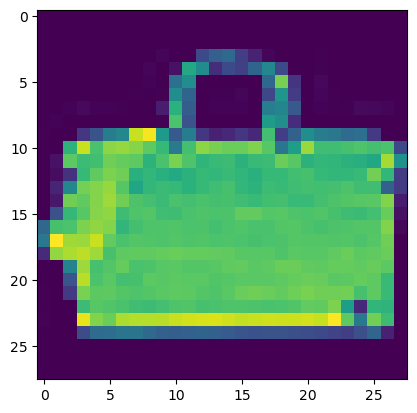

In [3]:
plt.imshow(trainImages[99])
plt.show()

La idea es que la red neuronal pueda distinguir los patrones y hacer una clasificación en las distintas categorías.

#### Limpieza de los datos

In [4]:
# Cambiamos el tipo de datos a float32 para que sea más fácil para la red neuronal
# Como los valores van de 0 a 255 entonces dividimos entre 255 para que queden entre 0 y 1
trainImages = trainImages.astype("float32") / 255
testImages = testImages.astype("float32") / 255

# Hacemos que los datos sean tensores de 60000, 28x28 y un solo canal
trainImages = trainImages.reshape(trainImages.shape[0], 28, 28, 1)
testImages = testImages.reshape(testImages.shape[0], 28, 28, 1)

# Hacemos un One Hot Encoding de las categorías
trainLabels = tf.keras.utils.to_categorical(trainLabels, 10)
testLabels = tf.keras.utils.to_categorical(testLabels, 10)

#### Creación del modelo

In [5]:
# Creamos un modelo secuencial como base
model = tf.keras.Sequential()
# Capa de convolución; 64 filtros; función de activación ReLu; forma de los datos de entrada
model.add(Conv2D(filters = 64, kernel_size = 2, padding = "same", activation = "relu", input_shape = (28, 28, 1)))
# Apilamos una capa de MaxPooling
model.add(MaxPooling2D(pool_size = 2))
# Capa de Dropout para reducir el Overfitting; se desactivan el 30% de las neuronas
model.add(Dropout(0.3))
# Capa de convolución; 32 filtros; función de activación ReLu
model.add(Conv2D(filters = 32, kernel_size = 2, padding = "same", activation = "relu"))
# Apilamos una capa de MaxPooling
model.add(MaxPooling2D(pool_size = 2))
# Capa de Dropout para reducir el Overfitting; se desactivan el 30% de las neuronas
model.add(Dropout(0.3))
# Capa que "aplana" los tensores para que queden en serie
model.add(Flatten())
# Una vez tenemos los datos de forma placa agregamos capas densas
model.add(Dense(256, activation = "relu"))
# Capa para reducir el Overfitting
model.add(Dropout(0.5))
# Capa final que arroja la predicción; 10 neuronas correspondientes a las 10 categorías; activación Softmax para la probabilidad de cada nivel
model.add(Dense(10, activation = "softmax"))

# Resumen del modelo
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 28, 28, 64)        320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 64)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 14, 14, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 14, 32)        8224      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 7, 7, 32)         0         
 2D)                                                             
                                                                 
 dropout_1 (Dropout)         (None, 7, 7, 32)          0

#### Entrenamiento del modelo

Primero compilamos el modelo especificando la función de pérdida, el optimizador y las métricas para evaluar.

In [6]:
model.compile(
    # Función de pérdida Categorical Cross Entropy porque es un problema de clasificación
    loss = "categorical_crossentropy",
    # Optimizador RMSPROP que es una versión mejorada del Gradient Descent
    optimizer = "rmsprop",
    # Como métrica utilizamos el Accuracy Score ya que es un problema de clasificación
    metrics = ["accuracy"]
)

Ahora entrenamos el modelo.

In [ ]:
# Entrenamos con los datos de entrenamiento; entrenamos con paquetes de 64 durante 10 épocas o iteraciones
model.fit(trainImages, trainLabels, batch_size = 64, epochs = 10)

Epoch 1/10
938/938 [==============================] - 57s 60ms/step - loss: 0.5870 - accuracy: 0.7845
Epoch 2/10
938/938 [==============================] - 52s 55ms/step - loss: 0.4019 - accuracy: 0.8560
Epoch 3/10
938/938 [==============================] - 53s 57ms/step - loss: 0.3597 - accuracy: 0.8697
Epoch 4/10
938/938 [==============================] - 54s 57ms/step - loss: 0.3357 - accuracy: 0.8795
Epoch 5/10
938/938 [==============================] - 47s 50ms/step - loss: 0.3210 - accuracy: 0.8839
Epoch 6/10
938/938 [==============================] - 47s 50ms/step - loss: 0.3105 - accuracy: 0.8881
Epoch 7/10
938/938 [==============================] - 44s 47ms/step - loss: 0.3047 - accuracy: 0.8919
Epoch 8/10
938/938 [==============================] - 43s 46ms/step - loss: 0.3008 - accuracy: 0.8926
Epoch 9/10
938/938 [==============================] - 41s 44ms/step - loss: 0.2949 - accuracy: 0.8950
Epoch 10/10
938/938 [==============================] - 41s 43ms/step - loss: 0.295

#### Evaluación del modelo

In [ ]:
# Evaluamos el modelo con los datos de testing
model.evaluate(testImages, testLabels, verbose = 0)

[0.2737152874469757, 0.9036999940872192]

#### Callbacks

Crearemos un callback de tipo Early Stopping que nos sirve para detener el entrenamiento del modelo si una métrica no mejora después de x iteraciones.

In [7]:
# Creamos un callback
early = tf.keras.callbacks.EarlyStopping(
    # Métrica que monitoreamos para ver si deja de mejorar
    monitor = "accuracy",
    # Número de iteraciones que espera para ver si la métrica no mejora
    patience = 10
)

# Entrenamos con los datos de entrenamiento; entrenamos con paquetes de 64 durante 10 épocas o iteraciones. Utilizamos el callback que creamos
model.fit(trainImages, trainLabels, batch_size = 64, epochs = 10, callbacks = [early])

Epoch 1/10
938/938 [==============================] - 61s 62ms/step - loss: 0.5889 - accuracy: 0.7856
Epoch 2/10
938/938 [==============================] - 69s 74ms/step - loss: 0.4046 - accuracy: 0.8557
Epoch 3/10
938/938 [==============================] - 58s 62ms/step - loss: 0.3599 - accuracy: 0.8715
Epoch 4/10
938/938 [==============================] - 65s 69ms/step - loss: 0.3397 - accuracy: 0.8774
Epoch 5/10
938/938 [==============================] - 49s 53ms/step - loss: 0.3222 - accuracy: 0.8837
Epoch 6/10
938/938 [==============================] - 52s 55ms/step - loss: 0.3123 - accuracy: 0.8887
Epoch 7/10
938/938 [==============================] - 55s 59ms/step - loss: 0.3078 - accuracy: 0.8895
Epoch 8/10
938/938 [==============================] - 55s 59ms/step - loss: 0.3050 - accuracy: 0.8931
Epoch 9/10
938/938 [==============================] - 62s 66ms/step - loss: 0.2961 - accuracy: 0.8948
Epoch 10/10
938/938 [==============================] - 57s 61ms/step - loss: 0.298

Existe otro callback muy útil llamado Checkpoint. Ejecutamos el entrenamiento del modelo a lo largo de las épocas que definamos pero en un archivo guardaremos los pesos de las redes que obtuvieron un mejor accuracy.

In [8]:
checkpoint = tf.keras.callbacks.ModelCheckpoint(
    # Nombre del archivo. La extensión hdf5 es usada para guardar los pesos del modelo
    filepath = "miPrimeraRedConvolucional.hdf5",
    verbose = 1,
    # Métrica que queremos monitorear
    monitor = "accuracy",
    # Solo guardar los mejores pesos
    save_best_only = True
)
# Entrenamos con los datos de entrenamiento; entrenamos con paquetes de 64 durante 10 épocas o iteraciones. Utilizamos el callback que creamos
model.fit(trainImages, trainLabels, batch_size = 64, epochs = 10, callbacks = [checkpoint])

Epoch 1/10
937/938 [============================>.] - ETA: 0s - loss: 0.2944 - accuracy: 0.8959
Epoch 1: accuracy improved from -inf to 0.89587, saving model to miPrimeraRedConvolucional.hdf5
938/938 [==============================] - 58s 62ms/step - loss: 0.2944 - accuracy: 0.8959
Epoch 2/10
937/938 [============================>.] - ETA: 0s - loss: 0.2944 - accuracy: 0.8956
Epoch 2: accuracy did not improve from 0.89587
938/938 [==============================] - 54s 57ms/step - loss: 0.2943 - accuracy: 0.8956
Epoch 3/10
937/938 [============================>.] - ETA: 0s - loss: 0.2925 - accuracy: 0.8990
Epoch 3: accuracy improved from 0.89587 to 0.89902, saving model to miPrimeraRedConvolucional.hdf5
938/938 [==============================] - 50s 53ms/step - loss: 0.2924 - accuracy: 0.8990
Epoch 4/10
937/938 [============================>.] - ETA: 0s - loss: 0.2906 - accuracy: 0.8976
Epoch 4: accuracy did not improve from 0.89902
938/938 [==============================] - 44s 47ms/st

Podemos crear un nuevo modelo con los pesos que guardamos en el archivo.

In [9]:
model2 = tf.keras.Sequential()
# Capa de convolución; 64 filtros; función de activación ReLu; forma de los datos de entrada
model2.add(Conv2D(filters = 64, kernel_size = 2, padding = "same", activation = "relu", input_shape = (28, 28, 1)))
# Apilamos una capa de MaxPooling
model2.add(MaxPooling2D(pool_size = 2))
# Capa de Dropout para reducir el Overfitting; se desactivan el 30% de las neuronas
model2.add(Dropout(0.3))
# Capa de convolución; 32 filtros; función de activación ReLu
model2.add(Conv2D(filters = 32, kernel_size = 2, padding = "same", activation = "relu"))
# Apilamos una capa de MaxPooling
model2.add(MaxPooling2D(pool_size = 2))
# Capa de Dropout para reducir el Overfitting; se desactivan el 30% de las neuronas
model2.add(Dropout(0.3))
# Capa que "aplana" los tensores para que queden en serie
model2.add(Flatten())
# Una vez tenemos los datos de forma placa agregamos capas densas
model2.add(Dense(256, activation = "relu"))
# Capa para reducir el Overfitting
model2.add(Dropout(0.5))
# Capa final que arroja la predicción; 10 neuronas correspondientes a las 10 categorías; activación Softmax para la probabilidad de cada nivel
model2.add(Dense(10, activation = "softmax"))

# Resumen del modelo
model2.summary()

model2.compile(
    # Función de pérdida Categorical Cross Entropy porque es un problema de clasificación
    loss = "categorical_crossentropy",
    # Optimizador RMSPROP que es una versión mejorada del Gradient Descent
    optimizer = "rmsprop",
    # Como métrica utilizamos el Accuracy Score ya que es un problema de clasificación
    metrics = ["accuracy"]
)


# Cargar los pesos del mejor modelo
model2.load_weights("miPrimeraRedConvolucional.hdf5")
# Evaluar el modelo
model2.evaluate(testImages, testLabels)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 28, 28, 64)        320       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 14, 14, 64)       0         
 2D)                                                             
                                                                 
 dropout_3 (Dropout)         (None, 14, 14, 64)        0         
                                                                 
 conv2d_3 (Conv2D)           (None, 14, 14, 32)        8224      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 7, 7, 32)         0         
 2D)                                                             
                                                                 
 dropout_4 (Dropout)         (None, 7, 7, 32)         

[0.26898589730262756, 0.9115999937057495]

### Batch Normalization

La normalización busca escalar un conjunto de datos haciendo que sus valores se concentren entre 0 y 1 en una misma escala; esto ayuda mucho al Descenso del Gradiente haciendo que converja más rápido.

La idea del batch normalization es realizar una normalización a lo largo del entrenamiento de la red en cada una de las capas ocultas. El resultado son datos normalizados incluso dentro de la red lo cual ayuda mucho al algoritmo a converger.

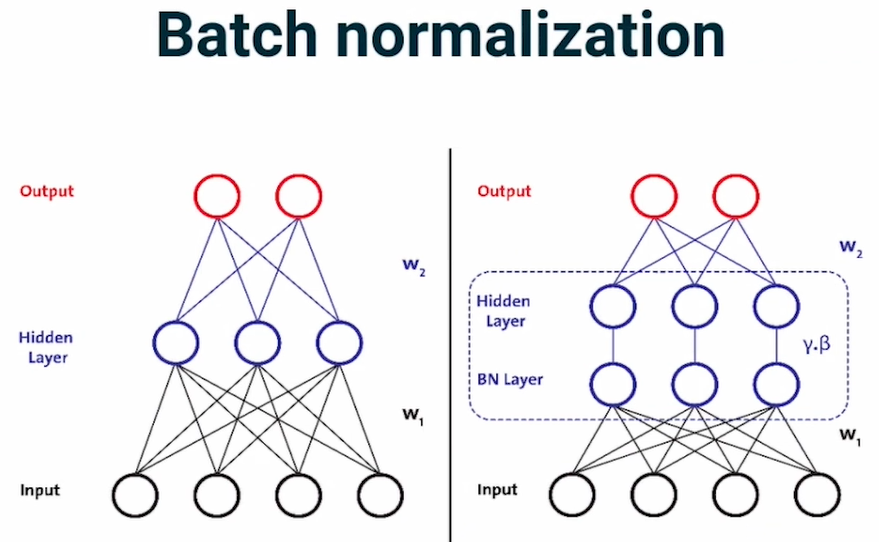
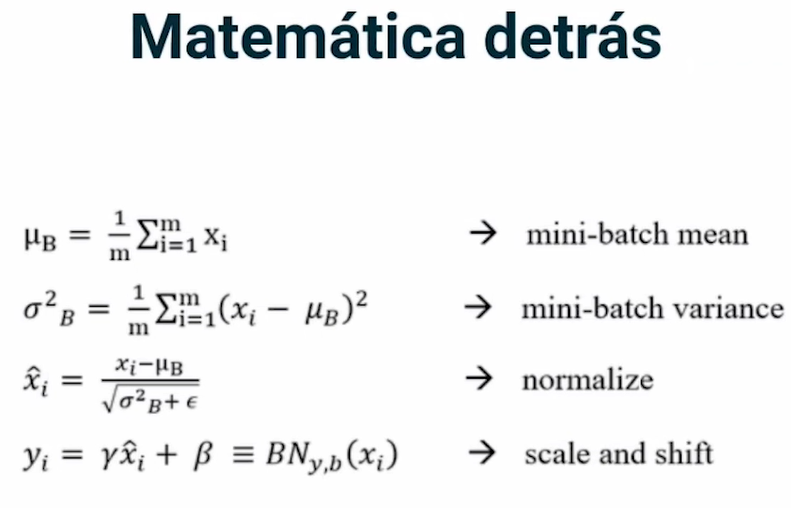

Se aplica agregando una capa llamada BatchNormalization.

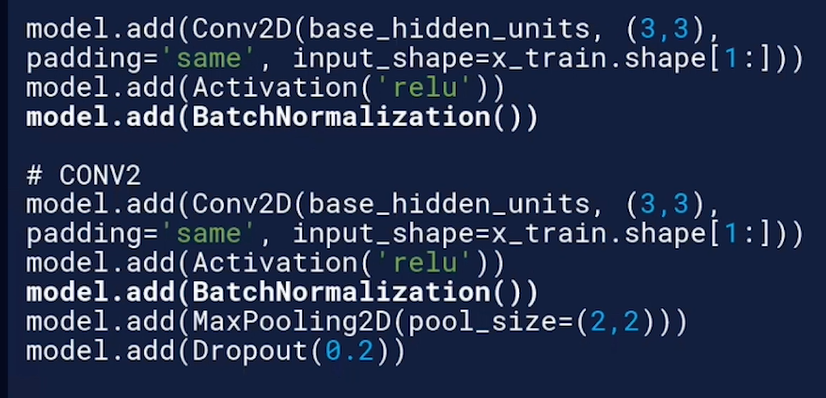

### Optimizadores

El optimizador es el encargado de generar pesos cada vez mejores; su importancia es crucial. Su funcionamiento esencial se basa en calcular el gradiente de la función de costo (derivada parcial) por cada peso (parámetro/dimensión) de la red.

El conjunto de métodos iterativos de reducción de la función de error (búsqueda de un mínimo local) son conocidos cómo los método de optimización basados en el descenso del gradiente.

**Principales optimizadores disponibles en Keras**
- Stochastic Gradient Descent (SGD): SGD hace algo tan simple cómo limitar el cálculo de la derivada a tan solo una observación (por batch).
- Adaptive Gradient Algorithm (AdaGrad): el algoritmo AdaGrad introduce una variación muy interesante en el concepto de factor de entrenamiento: en vez de considerar un valor uniforme para todos los pesos, se mantiene un factor de entrenamiento específico para cada uno de ellos. Sería inviable calcular este valor de forma específica así que, partiendo del factor de entrenamiento inicial, AdaGrad lo escala y adapta para cada dimensión con respecto al gradiente acumulado en cada iteración.
- Adadelta: Adadelta es una variación de AdaGrad en la que en vez de calcular el escalado del factor de entrenamiento de cada dimensión teniendo en cuenta el gradiente acumulado desde el principio de la ejecución, se restringe a una ventana de tamaño fijo de los últimos n gradientes.
- RMSprop (Root Mean Square Propagation): RMSProp es un algoritmo similar. También mantiene un factor de entrenamiento diferente para cada dimensión, pero en este caso el escalado del factor de entrenamiento se realiza dividiéndolo por la media del declive exponencial del cuadrado de los gradientes.
- Adam (Adaptive moment estimation): el algoritmo Adam combina las bondades de AdaGrad y RMSProp. Se mantiene un factor de entrenamiento por parámetro y además de calcular RMSProp, cada factor de entrenamiento también se ve afectado por la media del momentum del gradiente.

## Ahora optimizaremos el modelo de clasificación

### Clasificación con Redes Neuronales Convolucionales

Utilizaremos el dataset [**CIFAR10**](https://keras.io/api/datasets/cifar10/) el cual contiene 50000 imágenes de 32x32 a color para training y 10000 para testing; dichas imágenes pertenecen a una de diez categorías: avión, carro, pájaro, gato, ciervo, perro, rana, caballo, barco o camión.

#### Importar las bibliotecas

In [25]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import regularizers
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Activation, BatchNormalization
from tensorflow.keras import optimizers
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

#### Cargar los datos

In [11]:
(XTrain, yTrain), (XTest, yTest) = cifar10.load_data()

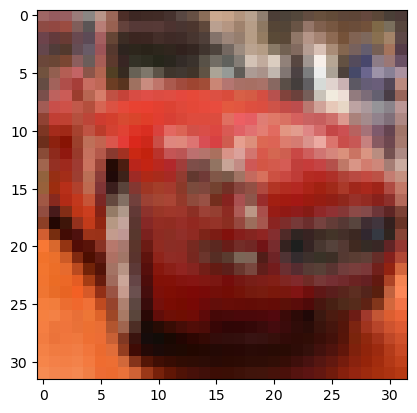

In [12]:
plt.imshow(XTrain[5])
plt.show()

#### Limpieza de los datos

Primero cambiamos el tipo de dato usado en las imágenes para que sean números de punto flotante.

In [14]:
XTrain = XTrain.astype("float32")
XTest = XTest.astype("float32")

Lo siguiente es codificar las categorías a las que pertenecen las imágenes.

In [15]:
# Las posibles clasificaciones que puede tener una imagen
numClasses = len(np.unique(yTrain))

# Codificamos la categoría
yTrain = to_categorical(yTrain, numClasses)
yTest = to_categorical(yTest, numClasses)

yTrain[5]

array([0., 1., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32)

Finalmente, aplicamos una normalización a los datos para que sus valores no sean tan dispersos.

In [16]:
mean = np.mean(XTrain)
std = np.std(XTrain)

XTrain = (XTrain - mean) / (std + 1e-7)
XTest = (XTest - mean) / (std + 1e-7)

#### División del set de Training

Dividiremos el conjunto de Training para tener un set de Validación.

In [17]:
XTrain.shape

(50000, 32, 32, 3)

Como tenemos 50000 imágenes para training entonces tomaremos 50000 para usarlas en validación.

In [18]:
(XTrain, XValid) = XTrain[5000:], XTrain[:5000]
(yTrain, yValid) = yTrain[5000:], yTrain[:5000]

Finalmente, nuestros datasets quedaron con las siguientes cantidades de imágenes.

In [19]:
print("Train: ", XTrain.shape[0])
print("Valid: ", XValid.shape[0])
print("Test: ", XTest.shape[0])

Train:  45000
Valid:  5000
Test:  10000


#### Construcción del modelo

In [20]:
# Número de filtros para las convolucioines
baseFilters = 32
# Peso para el regularizador
weightRegularizer = 1e-4

In [22]:
# Creamos un modelo secuencial
model = Sequential()

# Convolución 1

# Agregamos una capa de convolución con 32 filtros de tamaño 3x3; utlizamos padding same para que se mantengan las dimensiones de la imagen
# utilizamos regularización Ridge con un peso de 1e-4; tamaño de las imágenes de entrada de 32x32 con 3 capas
model.add(Conv2D(baseFilters, (3, 3), padding = "same", kernel_regularizer = regularizers.l2(weightRegularizer), input_shape = XTrain.shape[1:]))
# Agregamos una capa de activación con ReLu
model.add(Activation("relu"))
# Agregamos una capa de Batch Normalization
model.add(BatchNormalization())

# Convolución 2
# Agregamos una capa de convolución con 32 filtros de tamaño 3x3; utlizamos padding same para que se mantengan las dimensiones de la imagen
# utilizamos regularización Ridge con un peso de 1e-4
model.add(Conv2D(baseFilters, (3, 3), padding = "same", kernel_regularizer = regularizers.l2(weightRegularizer)))
# Agregamos una capa de activación con ReLu
model.add(Activation("relu"))
# Agregamos una capa de Batch Normalization
model.add(BatchNormalization())
# Agregamos capa de pooling para eliminar ruido y reducir complejidad; el tamaño será de 2x2
model.add(MaxPooling2D(pool_size = (2,2)))
# Agregamos una capa de Dropout para vigilar el Overfitting; la probabilidad de drop será de 0.2
model.add(Dropout(0.2))


"""
Haremos que las capas sean más profundas aumentando la cantidad de filtros cada dos capas; además, haremos el pooling cada dos convoluciones
"""

# Convolución 3
# Agregamos una capa de convolución con 64 filtros de tamaño 3x3; utlizamos padding same para que se mantengan las dimensiones de la imagen
# utilizamos regularización Ridge con un peso de 1e-4
model.add(Conv2D(2 * baseFilters, (3, 3), padding = "same", kernel_regularizer = regularizers.l2(weightRegularizer)))
# Agregamos una capa de activación con ReLu
model.add(Activation("relu"))
# Agregamos una capa de Batch Normalization
model.add(BatchNormalization())
# Agregamos una capa de Dropout para vigilar el Overfitting; la probabilidad de drop será de 0.2
model.add(Dropout(0.2))


# Convolución 4
# Agregamos una capa de convolución con 64 filtros de tamaño 3x3; utlizamos padding same para que se mantengan las dimensiones de la imagen
# utilizamos regularización Ridge con un peso de 1e-4
model.add(Conv2D(2 * baseFilters, (3, 3), padding = "same", kernel_regularizer = regularizers.l2(weightRegularizer)))
# Agregamos una capa de activación con ReLu
model.add(Activation("relu"))
# Agregamos una capa de Batch Normalization
model.add(BatchNormalization())
# Agregamos capa de pooling para eliminar ruido y reducir complejidad; el tamaño será de 2x2
model.add(MaxPooling2D(pool_size = (2,2)))
# Agregamos una capa de Dropout para vigilar el Overfitting; la probabilidad de drop será de 0.3
model.add(Dropout(0.3))


# Convolución 5
# Agregamos una capa de convolución con 128 filtros de tamaño 3x3; utlizamos padding same para que se mantengan las dimensiones de la imagen
# utilizamos regularización Ridge con un peso de 1e-4
model.add(Conv2D(4 * baseFilters, (3, 3), padding = "same", kernel_regularizer = regularizers.l2(weightRegularizer)))
# Agregamos una capa de activación con ReLu
model.add(Activation("relu"))
# Agregamos una capa de Batch Normalization
model.add(BatchNormalization())
# Agregamos una capa de Dropout para vigilar el Overfitting; la probabilidad de drop será de 0.3
model.add(Dropout(0.3))


# Convolución 6
# Agregamos una capa de convolución con 128 filtros de tamaño 3x3; utlizamos padding same para que se mantengan las dimensiones de la imagen
# utilizamos regularización Ridge con un peso de 1e-4
model.add(Conv2D(4 * baseFilters, (3, 3), padding = "same", kernel_regularizer = regularizers.l2(weightRegularizer)))
# Agregamos una capa de activación con ReLu
model.add(Activation("relu"))
# Agregamos una capa de Batch Normalization
model.add(BatchNormalization())
# Agregamos capa de pooling para eliminar ruido y reducir complejidad; el tamaño será de 2x2
model.add(MaxPooling2D(pool_size = (2,2)))
# Agregamos una capa de Dropout para vigilar el Overfitting; la probabilidad de drop será de 0.3
model.add(Dropout(0.4))


# Clasificación
# Aplanamos el resultado de las capas anteriores para que sea un array de dimensión 1
model.add(Flatten())
# Agregamos la capa densa que tendrá 10 neuronas y utilizará la función Softmax para devolver la probabilidad de cada label
model.add(Dense(numClasses, activation = "softmax"))


# Resumen del modelo
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 32, 32, 32)        896       
                                                                 
 activation (Activation)     (None, 32, 32, 32)        0         
                                                                 
 batch_normalization (BatchN  (None, 32, 32, 32)       128       
 ormalization)                                                   
                                                                 
 conv2d_5 (Conv2D)           (None, 32, 32, 32)        9248      
                                                                 
 activation_1 (Activation)   (None, 32, 32, 32)        0         
                                                                 
 batch_normalization_1 (Batc  (None, 32, 32, 32)       128       
 hNormalization)                                      

#### Data Augmentation

In [24]:
dataGen = ImageDataGenerator(
    # Rotación en grados
    rotation_range = 15,
    # Mover la imagen en el eje X
    width_shift_range = 0.1,
    # Mover la imagen en el eje Y
    height_shift_range = 0.1,
    # Zoom
    zoom_range = 0.2,
    # Habilitar que pueda usar un modo espejo de forma horizontal
    horizontal_flip = True,
    # Habilitar que pueda usar un modo espejo de forma vertical
    vertical_flip = True,
    # Rellenar los espacios vacíos de la imagen al momento de transformarla
    fill_mode = "nearest",
    # Cambiar el brillo de la imagen
    brightness_range = [0.4, 1.5]
)

#### Compilar el modelo

In [26]:
# Compilamos el modelo con función de pérdida Categorical Cross-Entropy; optimizador Adam; como métrica utilizamos el Accuracy
model.compile(
    loss = "categorical_crossentropy",
    optimizer = optimizers.Adam(),
    metrics = "accuracy"
)

#### Callbacks

In [28]:
checkpoint = ModelCheckpoint(
    # Nombre del archivo. La extensión hdf5 es usada para guardar los pesos del modelo
    filepath = "miMejorModelo.hdf5",
    verbose = 1,
    # Métrica que queremos monitorear
    monitor = "val_accuracy",
    # Solo guardar los mejores pesos
    save_best_only = True
)

early = EarlyStopping(
    # Métrica que monitoreamos para ver si deja de mejorar
    monitor = "val_accuracy",
    # Número de iteraciones que espera para ver si la métrica no mejora
    patience = 8
)

#### Entrenamiento del modelo

In [29]:
# Entrenamos el modelo con nuestro Data Generator
hist = model.fit(
    # Generar imágenes con los datos de entrenamiento; paquetes de 128
    dataGen.flow(XTrain, yTrain, batch_size = 128),
    # Utilizar los callbacks que creamos
    callbacks = [early, checkpoint],
    # Pasos por épocas igual a la cantidad de imágenes en XTrain divido el tamaño de los batches
    steps_per_epoch = XTrain.shape[0] // 128,
    # Entrenamos por 60 épocas
    epochs = 60,
    # Sets de validación
    validation_data = (XValid, yValid),
    verbose = 2,
    # Mezclar los datos
    shuffle = True
)

Epoch 1/60


KeyboardInterrupt: 

#### Evaluación del modelo

In [ ]:
plt.plot(hist.history["accuracy"], label = "Train")
plt.plot(hist.history["val_accuracy"], label = "Validation")
plt.legend()
plt.show()

In [ ]:
model.evaluate(XTest, yTest)

#### Mejor modelo

In [ ]:
model2 = Sequential()

# Convolución 1

# Agregamos una capa de convolución con 32 filtros de tamaño 3x3; utlizamos padding same para que se mantengan las dimensiones de la imagen
# utilizamos regularización Ridge con un peso de 1e-4; tamaño de las imágenes de entrada de 32x32 con 3 capas
model2.add(Conv2D(baseFilters, (3, 3), padding = "same", kernel_regularizer = regularizers.l2(weightRegularizer), input_shape = XTrain.shape[1:]))
# Agregamos una capa de activación con ReLu
model2.add(Activation("relu"))
# Agregamos una capa de Batch Normalization
model2.add(BatchNormalization())

# Convolución 2
# Agregamos una capa de convolución con 32 filtros de tamaño 3x3; utlizamos padding same para que se mantengan las dimensiones de la imagen
# utilizamos regularización Ridge con un peso de 1e-4
model2.add(Conv2D(baseFilters, (3, 3), padding = "same", kernel_regularizer = regularizers.l2(weightRegularizer)))
# Agregamos una capa de activación con ReLu
model2.add(Activation("relu"))
# Agregamos una capa de Batch Normalization
model2.add(BatchNormalization())
# Agregamos capa de pooling para eliminar ruido y reducir complejidad; el tamaño será de 2x2
model2.add(MaxPooling2D(pool_size = (2,2)))
# Agregamos una capa de Dropout para vigilar el Overfitting; la probabilidad de drop será de 0.2
model2.add(Dropout(0.2))


"""
Haremos que las capas sean más profundas aumentando la cantidad de filtros cada dos capas; además, haremos el pooling cada dos convoluciones
"""

# Convolución 3
# Agregamos una capa de convolución con 64 filtros de tamaño 3x3; utlizamos padding same para que se mantengan las dimensiones de la imagen
# utilizamos regularización Ridge con un peso de 1e-4
model2.add(Conv2D(2 * baseFilters, (3, 3), padding = "same", kernel_regularizer = regularizers.l2(weightRegularizer)))
# Agregamos una capa de activación con ReLu
model2.add(Activation("relu"))
# Agregamos una capa de Batch Normalization
model2.add(BatchNormalization())
# Agregamos una capa de Dropout para vigilar el Overfitting; la probabilidad de drop será de 0.2
model2.add(Dropout(0.2))


# Convolución 4
# Agregamos una capa de convolución con 64 filtros de tamaño 3x3; utlizamos padding same para que se mantengan las dimensiones de la imagen
# utilizamos regularización Ridge con un peso de 1e-4
model2.add(Conv2D(2 * baseFilters, (3, 3), padding = "same", kernel_regularizer = regularizers.l2(weightRegularizer)))
# Agregamos una capa de activación con ReLu
model2.add(Activation("relu"))
# Agregamos una capa de Batch Normalization
model2.add(BatchNormalization())
# Agregamos capa de pooling para eliminar ruido y reducir complejidad; el tamaño será de 2x2
model2.add(MaxPooling2D(pool_size = (2,2)))
# Agregamos una capa de Dropout para vigilar el Overfitting; la probabilidad de drop será de 0.3
model2.add(Dropout(0.3))


# Convolución 5
# Agregamos una capa de convolución con 128 filtros de tamaño 3x3; utlizamos padding same para que se mantengan las dimensiones de la imagen
# utilizamos regularización Ridge con un peso de 1e-4
model2.add(Conv2D(4 * baseFilters, (3, 3), padding = "same", kernel_regularizer = regularizers.l2(weightRegularizer)))
# Agregamos una capa de activación con ReLu
model2.add(Activation("relu"))
# Agregamos una capa de Batch Normalization
model2.add(BatchNormalization())
# Agregamos una capa de Dropout para vigilar el Overfitting; la probabilidad de drop será de 0.3
model2.add(Dropout(0.3))


# Convolución 6
# Agregamos una capa de convolución con 128 filtros de tamaño 3x3; utlizamos padding same para que se mantengan las dimensiones de la imagen
# utilizamos regularización Ridge con un peso de 1e-4
model2.add(Conv2D(4 * baseFilters, (3, 3), padding = "same", kernel_regularizer = regularizers.l2(weightRegularizer)))
# Agregamos una capa de activación con ReLu
model2.add(Activation("relu"))
# Agregamos una capa de Batch Normalization
model2.add(BatchNormalization())
# Agregamos capa de pooling para eliminar ruido y reducir complejidad; el tamaño será de 2x2
model2.add(MaxPooling2D(pool_size = (2,2)))
# Agregamos una capa de Dropout para vigilar el Overfitting; la probabilidad de drop será de 0.3
model2.add(Dropout(0.4))


# Clasificación
# Aplanamos el resultado de las capas anteriores para que sea un array de dimensión 1
model2.add(Flatten())
# Agregamos la capa densa que tendrá 10 neuronas y utilizará la función Softmax para devolver la probabilidad de cada label
model2.add(Dense(numClasses, activation = "softmax"))


# Resumen del modelo
model2.summary()

# Compilamos el modelo con función de pérdida Categorical Cross-Entropy; optimizador Adam; como métrica utilizamos el Accuracy
model2.compile(
    loss = "categorical_crossentropy",
    optimizer = optimizers.Adam(),
    metrics = "accuracy"
)

# Cargar los pesos del mejor modelo
model2.load_weights("miMejorModelo.hdf5")

# Evaluar el modelo
model2.evaluate(XTest, yTest)

## Resolviendo una competencia de Kaggle

Resolveremos una competencia de clasificación de imágenes entre perros y gatos. [Datos](https://www.kaggle.com/competitions/dogs-vs-cats/data)

### Importar bibliotecas

In [25]:
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import models, optimizers, regularizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, BatchNormalization

### Creación del modelo convolucional

In [10]:
# Creamos un modelo secuencial
model = Sequential()

"""
Capa de entrada
"""
# Agregamos una capa de convolución
model.add(Conv2D(
        # 32 kernels
        filters = 32, 
        # Kernels de 3x3
        kernel_size = (3, 3),
        # Agregamos un padding para que las imágenes después del kernel tengan el mismo tamaño que las de entrada
        padding = "same",
        # Función de activación ReLu
        activation = "relu",
        # Utilizamos regularización Ridge con peso de 1e-5
        kernel_regularizer = regularizers.l2(1e-5),
        # Datos de entrada de 150x150 pixeles con 3 canales
        input_shape = (150, 150, 3)
    )
)
# Apilamos una capa de Batch Normalization
model.add(BatchNormalization())
# Apilamos una capa de MaxPooling para eliminar ruido de tamaño 2x2
model.add(MaxPooling2D(pool_size = (2, 2)))

"""
Capa de convolución 2
"""
# Agregamos una capa de convolución
model.add(Conv2D(
        # 64 kernels
        filters = 64, 
        # Kernels de 3x3
        kernel_size = (3, 3),
        # Agregamos un padding para que las imágenes después del kernel tengan el mismo tamaño que las de entrada
        padding = "same",
        # Función de activación ReLu
        activation = "relu",
        # Utilizamos regularización Ridge con peso de 1e-5
        kernel_regularizer = regularizers.l2(1e-5),
    )
)
# Apilamos una capa de Batch Normalization
model.add(BatchNormalization())
# Apilamos una capa de MaxPooling para eliminar ruido de tamaño 2x2
model.add(MaxPooling2D(pool_size = (2, 2)))
# Agregamos una capa de Dropout para vigilar el Overfitting; la probabilidad de drop será de 0.2
model.add(Dropout(0.2))

"""
Capa de convolución 3
"""
# Agregamos una capa de convolución
model.add(Conv2D(
        # 128 kernels
        filters = 128, 
        # Kernels de 3x3
        kernel_size = (3, 3),
        # Agregamos un padding para que las imágenes después del kernel tengan el mismo tamaño que las de entrada
        padding = "same",
        # Función de activación ReLu
        activation = "relu",
        # Utilizamos regularización Ridge con peso de 1e-5
        kernel_regularizer = regularizers.l2(1e-5),
    )
)
# Apilamos una capa de Batch Normalization
model.add(BatchNormalization())
# Apilamos una capa de MaxPooling para eliminar ruido de tamaño 2x2
model.add(MaxPooling2D(pool_size = (2, 2)))
# Agregamos una capa de Dropout para vigilar el Overfitting; la probabilidad de drop será de 0.3
model.add(Dropout(0.3))

"""
Capa de convolución 4
"""
# Agregamos una capa de convolución
model.add(Conv2D(
        # 128 kernels
        filters = 128, 
        # Kernels de 3x3
        kernel_size = (3, 3),
        # Agregamos un padding para que las imágenes después del kernel tengan el mismo tamaño que las de entrada
        padding = "same",
        # Función de activación ReLu
        activation = "relu",
        # Utilizamos regularización Ridge con peso de 1e-5
        kernel_regularizer = regularizers.l2(1e-5),
    )
)
# Apilamos una capa de Batch Normalization
model.add(BatchNormalization())
# Apilamos una capa de MaxPooling para eliminar ruido de tamaño 2x2
model.add(MaxPooling2D(pool_size = (2, 2)))
# Agregamos una capa de Dropout para vigilar el Overfitting; la probabilidad de drop será de 0.4
model.add(Dropout(0.4))

"""
Capa de salida
"""
# Agregamos una capa Flatten para aplanar los datos y que queden en una sola dimensión
model.add(Flatten())
# Agregamos una capa de Dropout para vigilar el Overfitting; la probabilidad de drop será de 0.5
model.add(Dropout(0.5))
# Agregamos una capa Densa con 512 neuronas y activación ReLu
model.add(Dense(512, activation = "relu"))
# Agregamos la capa encargada de la clasificación binaria con activación Sigmoide
model.add(Dense(1, activation = "sigmoid"))

# Resumen del modelo
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 150, 150, 32)      896       
                                                                 
 batch_normalization_4 (Batc  (None, 150, 150, 32)     128       
 hNormalization)                                                 
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 75, 75, 32)       0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 75, 75, 64)        18496     
                                                                 
 batch_normalization_5 (Batc  (None, 75, 75, 64)       256       
 hNormalization)                                                 
                                                      

### Data Augmentation

In [19]:
# Creamos un generador de imágenes para Training
trainImgGen = ImageDataGenerator(
    # Escalar los valores de las imágenes para que vayan entre 0 y 1
    rescale = 1. / 255,
    # Rotación de 40°
    rotation_range = 40,
    # Movimiento horizontal
    width_shift_range = 0.2,
    # Movimiento vertical
    height_shift_range = 0.2,
    # Cortar
    shear_range = 0.2,
    # Zoom
    zoom_range = 0.2,
    # Rotación horizontal
    horizontal_flip = True,
    # Rotación vertical
    vertical_flip = True,
    # Rellenar los espacios vacíos de la imagen al momento de transformarla
    fill_mode = "nearest",
)

# Creamos un generador de imágenes para  Test simplemente escalando los valores para que vayan de 0 a 1
testDataGen = ImageDataGenerator(rescale = 1. / 255)

### Reescalar los datos

In [20]:
# Generamos imágenes para training cargándolas de un directorio
trainGenerator = trainImgGen.flow_from_directory("catsDogs/train",
    # Tamaño de las imágenes
    target_size = (150, 150),
    # Paquetes de a 64 imágenes
    batch_size = 64,
    # Clasificación binaria
    class_mode = "binary"
)

# Generamos imágenes para validation cargándolas de un directorio y solamente reescalándolas
validationGenerator = testDataGen.flow_from_directory("catsDogs/validation",
    # Tamaño de las imágenes
    target_size = (150, 150),
    # Paquetes de a 64 imágenes
    batch_size = 64,
    # Clasificación binaria
    class_mode = "binary"
)

# Generamos imágenes para testing cargándolas de un directorio y solamente reescalándolas
testGenerator = testDataGen.flow_from_directory("catsDogs/test",
    # Tamaño de las imágenes
    target_size = (150, 150),
    # Paquetes de a 64 imágenes
    batch_size = 64,
    # Clasificación binaria
    class_mode = "binary"
)

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


### Callbacks

In [21]:
checkpoint = ModelCheckpoint(
    # Nombre del archivo. La extensión hdf5 es usada para guardar los pesos del modelo
    filepath = "catsVsDogs.hdf5",
    verbose = 1,
    # Métrica que queremos monitorear
    monitor = "val_accuracy",
    # Solo guardar los mejores pesos
    save_best_only = True
)

early = EarlyStopping(
    # Métrica que monitoreamos para ver si deja de mejorar
    monitor = "val_accuracy",
    # Número de iteraciones que espera para ver si la métrica no mejora
    patience = 15
)

### Compilar el modelo

In [22]:
model.compile(
    # Función de pérdida Binary Cross Entropy
    loss = "binary_crossentropy",
    # Como optimizador utilizamos Adam que combina las bondades de AdaGrad y RMSProp
    optimizer = optimizers.Adam(),
    # Como métrica utilizamos el Accuracy Score
    metrics = "accuracy"
)

### Entrenamiento del modelo

In [23]:
# Entrenamos el modelo con nuestro Data Generator
hist = model.fit(
    # Utiliza las imágenes generadas por el Train Generator
    trainGenerator,
    # Utilizar los callbacks que creamos
    callbacks = [early, checkpoint],
    # Pasos por épocas igual a la cantidad de imágenes para training divido el tamaño de los batches
    steps_per_epoch = 2000 // 64,
    # Entrenamos por 60 épocas
    epochs = 60,
    # Para validación utilizamos las imágenes generadas por el Validation Generator
    validation_data = validationGenerator,
    # Pasos para validación igual a la cantidad de imágenes para testing divido el tamaño de los batches
    validation_steps = 1000 // 64,
    verbose = 2,
    # Mezclar los datos
    shuffle = True
)

Epoch 1/60

Epoch 1: val_accuracy improved from -inf to 0.51562, saving model to catsVsDogs.hdf5
31/31 - 81s - loss: 0.6798 - accuracy: 0.6136 - val_loss: 0.8559 - val_accuracy: 0.5156 - 81s/epoch - 3s/step
Epoch 2/60

Epoch 2: val_accuracy did not improve from 0.51562
31/31 - 73s - loss: 0.6799 - accuracy: 0.6038 - val_loss: 2.2453 - val_accuracy: 0.5021 - 73s/epoch - 2s/step
Epoch 3/60

Epoch 3: val_accuracy did not improve from 0.51562
31/31 - 77s - loss: 0.6732 - accuracy: 0.6136 - val_loss: 2.9985 - val_accuracy: 0.4990 - 77s/epoch - 2s/step
Epoch 4/60

Epoch 4: val_accuracy did not improve from 0.51562
31/31 - 73s - loss: 0.6655 - accuracy: 0.6209 - val_loss: 2.0358 - val_accuracy: 0.4990 - 73s/epoch - 2s/step
Epoch 5/60

Epoch 5: val_accuracy improved from 0.51562 to 0.53333, saving model to catsVsDogs.hdf5
31/31 - 75s - loss: 0.6321 - accuracy: 0.6410 - val_loss: 0.8928 - val_accuracy: 0.5333 - 75s/epoch - 2s/step
Epoch 6/60

Epoch 6: val_accuracy did not improve from 0.53333
3

### Evaluación del modelo

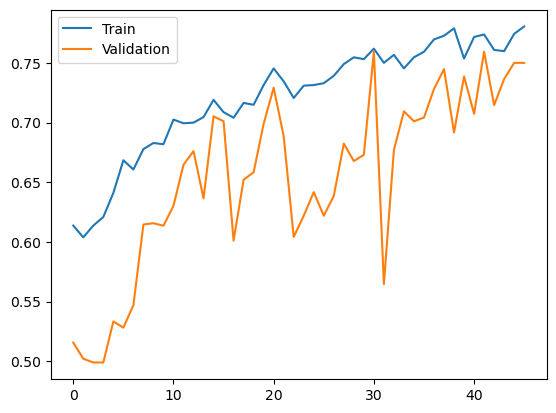

In [26]:
plt.plot(hist.history["accuracy"], label = "Train")
plt.plot(hist.history["val_accuracy"], label = "Validation")
plt.legend()
plt.show()

In [27]:
model.evaluate(testGenerator)

16/16 [==============================] - 23s 1s/step - loss: 0.5665 - accuracy: 0.7170


[0.5665481090545654, 0.7170000076293945]